**DIABETES DATASET ANALYST**

•	**Pregnancies**: Number of times pregnant

•	**Glucose** is the glucose concentration present in the blood (plasma). For a healthy person (a non-diabetic), the normal glucose concentration is between 4.0 to 5.4 mmol/L (72 to 99 mg/dL) and up to 7.8 mmol/L (140 mg/dL) 2 hours after eating.

•	**Blood Pressure**: Diastolic blood pressure (mm Hg). Normal blood pressure should be less than or equal to 120/80 mmHg.

•	**SkinThickness**: Triceps skinfold thickness (mm). The triceps skinfold is necessary for calculating the upper arm muscle circumference. Its thickness gives information about the fat reserves of the body. For adults, the standard typical values for triceps skinfolds are 2.5mm (men) or about 20% fat; 18.0mm (women) or about 30% fat.

•	**Insulin**: 2-Hour serum insulin (mu U/ml). The normal insulin level range 2 hours after glucose administration is 16–166 mIU/L.

•	**BMI**: Body mass index (weight in kg/ (height in m²)). BMI measures body fat based on height and weight, which applies to adult men and women. An underweight person has a BMI of 18.5 or less, a normal weight person has a BMI range of 18.5–24.9, an overweight person has a BMI of 25–29.9, and an obese person has a BMI of 30 or greater.

•	**DiabetesPedigreeFunction**: A diabetes pedigree function is a function that scores the likelihood of diabetes based on family history.

•	**Outcome** (target variable): 0 — no diabetes, 1 — has diabetes.


In [154]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import mlxtend
import warnings

from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import cross_val_score 
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay, precision_score, recall_score, f1_score, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score

import all libraries

We create a dataframe and take copies of this dataframe. Because we should avoid performing operations on the original dataframe.

In [155]:
df_ = pd.read_csv("diabetes.csv")
df=df_.copy()
df_ml=df_.copy()
df_ot=df_.copy()

We want to see how many rows and columns the dataframe consists of.

In [156]:
df.shape

(768, 9)

In [157]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


Dataframe Columns

In [158]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [159]:
df.size

6912

In [160]:
df.nunique()

Pregnancies                  17
Glucose                     136
BloodPressure                47
SkinThickness                51
Insulin                     186
BMI                         248
DiabetesPedigreeFunction    517
Age                          52
Outcome                       2
dtype: int64

Is there any duplicate data?

In [161]:
sum(df.duplicated())

0

Look at the data in each column

In [162]:
for col in df:
    print(col)
    print(df[col].unique())
    print('\n')

Pregnancies
[ 6  1  8  0  5  3 10  2  4  7  9 11 13 15 17 12 14]


Glucose
[148  85 183  89 137 116  78 115 197 125 110 168 139 189 166 100 118 107
 103 126  99 196 119 143 147  97 145 117 109 158  88  92 122 138 102  90
 111 180 133 106 171 159 146  71 105 101 176 150  73 187  84  44 141 114
  95 129  79   0  62 131 112 113  74  83 136  80 123  81 134 142 144  93
 163 151  96 155  76 160 124 162 132 120 173 170 128 108 154  57 156 153
 188 152 104  87  75 179 130 194 181 135 184 140 177 164  91 165  86 193
 191 161 167  77 182 157 178  61  98 127  82  72 172  94 175 195  68 186
 198 121  67 174 199  56 169 149  65 190]


BloodPressure
[ 72  66  64  40  74  50   0  70  96  92  80  60  84  30  88  90  94  76
  82  75  58  78  68 110  56  62  85  86  48  44  65 108  55 122  54  52
  98 104  95  46 102 100  61  24  38 106 114]


SkinThickness
[35 29  0 23 32 45 19 47 38 30 41 33 26 15 36 11 31 37 42 25 18 24 39 27
 21 34 10 60 13 20 22 28 54 40 51 56 14 17 50 44 12 46 16  7 52 43 48  8
 4

the first ten lines

In [163]:
df.head(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.60,0.63,50,1
1,1,85,66,29,0,26.60,0.35,31,0
2,8,183,64,0,0,23.30,0.67,32,1
3,1,89,66,23,94,28.10,0.17,21,0
4,0,137,40,35,168,43.10,2.29,33,1
5,5,116,74,0,0,25.60,0.20,30,0
6,3,78,50,32,88,31.00,0.25,26,1
7,10,115,0,0,0,35.30,0.13,29,0
8,2,197,70,45,543,30.50,0.16,53,1
9,8,125,96,0,0,0.00,0.23,54,1


The last ten lines

In [164]:
df.tail(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
758,1,106,76,0,0,37.50,0.20,26,0
759,6,190,92,0,0,35.50,0.28,66,1
760,2,88,58,26,16,28.40,0.77,22,0
761,9,170,74,31,0,44.00,0.40,43,1
762,9,89,62,0,0,22.50,0.14,33,0
763,10,101,76,48,180,32.90,0.17,63,0
764,2,122,70,27,0,36.80,0.34,27,0
765,5,121,72,23,112,26.20,0.24,30,0
766,1,126,60,0,0,30.10,0.35,47,1
767,1,93,70,31,0,30.40,0.32,23,0


Number of patients and non-patients

In [165]:
outcome =df['Outcome'].value_counts()
print(outcome)

Outcome
0    500
1    268
Name: count, dtype: int64


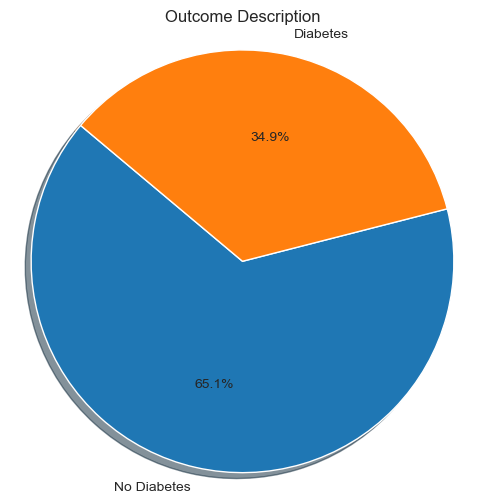

In [166]:
plt.figure(figsize=(6, 6))
outcome_counts = df['Outcome'].value_counts()
labels = ['No Diabetes', 'Diabetes']
plt.pie(outcome_counts, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.title('Outcome Description')
plt.show()

In [258]:
df.isnull().values.any()

False

Detailed information about each line; such as mean, median, standard deviation

In [167]:
df.describe([.01,.10, .25, .50, .75, 0.80, .90,.99]).T

,count,mean,std,min,1%,10%,25%,50%,75%,80%,90%,99%,max
Pregnancies,768.00,3.85,3.37,0.00,0.00,0.00,1.00,3.00,6.00,7.00,9.00,13.00,17.00
Glucose,768.00,120.89,31.97,0.00,57.00,85.00,99.00,117.00,140.25,147.00,167.00,196.00,199.00
BloodPressure,768.00,69.11,19.36,0.00,0.00,54.00,62.00,72.00,80.00,82.00,88.00,106.00,122.00
SkinThickness,768.00,20.54,15.95,0.00,0.00,0.00,0.00,23.00,32.00,35.00,40.00,51.33,99.00
Insulin,768.00,79.80,115.24,0.00,0.00,0.00,0.00,30.50,127.25,150.00,210.00,519.90,846.00
BMI,768.00,31.99,7.88,0.00,0.00,23.60,27.30,32.00,36.60,37.80,41.50,50.76,67.10
DiabetesPedigreeFunction,768.00,0.47,0.33,0.08,0.09,0.17,0.24,0.37,0.63,0.69,0.88,1.70,2.42
Age,768.00,33.24,11.76,21.00,21.00,22.00,24.00,29.00,41.00,42.60,51.00,67.00,81.00
Outcome,768.00,0.35,0.48,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00,1.00


Detailed information about healty

In [168]:
df[df.Outcome == 0].describe().T 

,count,mean,std,min,25%,50%,75%,max
Pregnancies,500.00,3.30,3.02,0.00,1.00,2.00,5.00,13.00
Glucose,500.00,109.98,26.14,0.00,93.00,107.00,125.00,197.00
BloodPressure,500.00,68.18,18.06,0.00,62.00,70.00,78.00,122.00
SkinThickness,500.00,19.66,14.89,0.00,0.00,21.00,31.00,60.00
Insulin,500.00,68.79,98.87,0.00,0.00,39.00,105.00,744.00
BMI,500.00,30.30,7.69,0.00,25.40,30.05,35.30,57.30
DiabetesPedigreeFunction,500.00,0.43,0.30,0.08,0.23,0.34,0.56,2.33
Age,500.00,31.19,11.67,21.00,23.00,27.00,37.00,81.00
Outcome,500.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


Detailed information about unhealty

In [169]:
df[df.Outcome == 1].describe().T 

,count,mean,std,min,25%,50%,75%,max
Pregnancies,268.00,4.87,3.74,0.00,1.75,4.00,8.00,17.00
Glucose,268.00,141.26,31.94,0.00,119.00,140.00,167.00,199.00
BloodPressure,268.00,70.82,21.49,0.00,66.00,74.00,82.00,114.00
SkinThickness,268.00,22.16,17.68,0.00,0.00,27.00,36.00,99.00
Insulin,268.00,100.34,138.69,0.00,0.00,0.00,167.25,846.00
BMI,268.00,35.14,7.26,0.00,30.80,34.25,38.78,67.10
DiabetesPedigreeFunction,268.00,0.55,0.37,0.09,0.26,0.45,0.73,2.42
Age,268.00,37.07,10.97,21.00,28.00,36.00,44.00,70.00
Outcome,268.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00


number of rows of data with bar

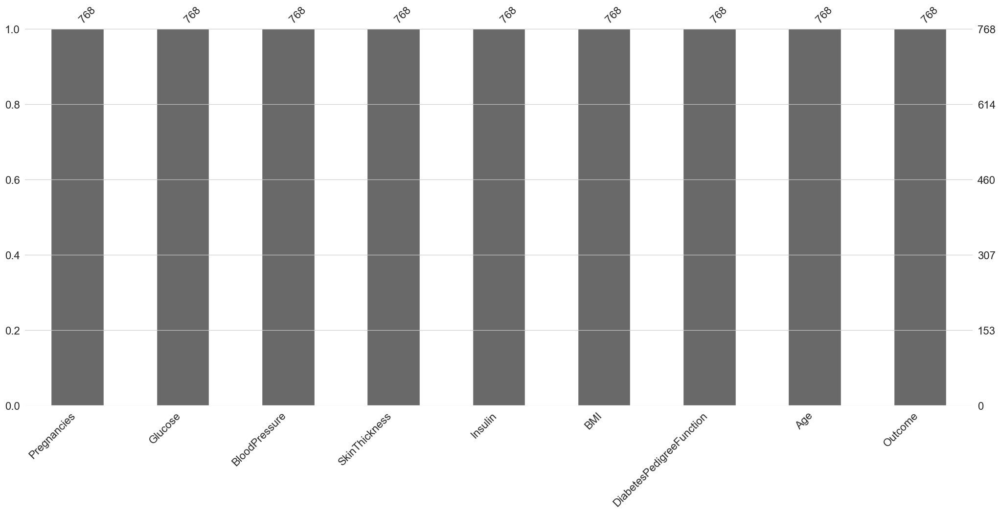

In [170]:
msno.bar(df)
plt.show()

missing values

In [171]:
df.isnull().values.any()

False

Correlastion 

In [172]:
corr=df.corr()

In [173]:
corr

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.00,0.13,0.14,-0.08,-0.07,0.02,-0.03,0.54,0.22
Glucose,0.13,1.00,0.15,0.06,0.33,0.22,0.14,0.26,0.47
BloodPressure,0.14,0.15,1.00,0.21,0.09,0.28,0.04,0.24,0.07
SkinThickness,-0.08,0.06,0.21,1.00,0.44,0.39,0.18,-0.11,0.07
Insulin,-0.07,0.33,0.09,0.44,1.00,0.20,0.19,-0.04,0.13
BMI,0.02,0.22,0.28,0.39,0.20,1.00,0.14,0.04,0.29
DiabetesPedigreeFunction,-0.03,0.14,0.04,0.18,0.19,0.14,1.00,0.03,0.17
Age,0.54,0.26,0.24,-0.11,-0.04,0.04,0.03,1.00,0.24
Outcome,0.22,0.47,0.07,0.07,0.13,0.29,0.17,0.24,1.00


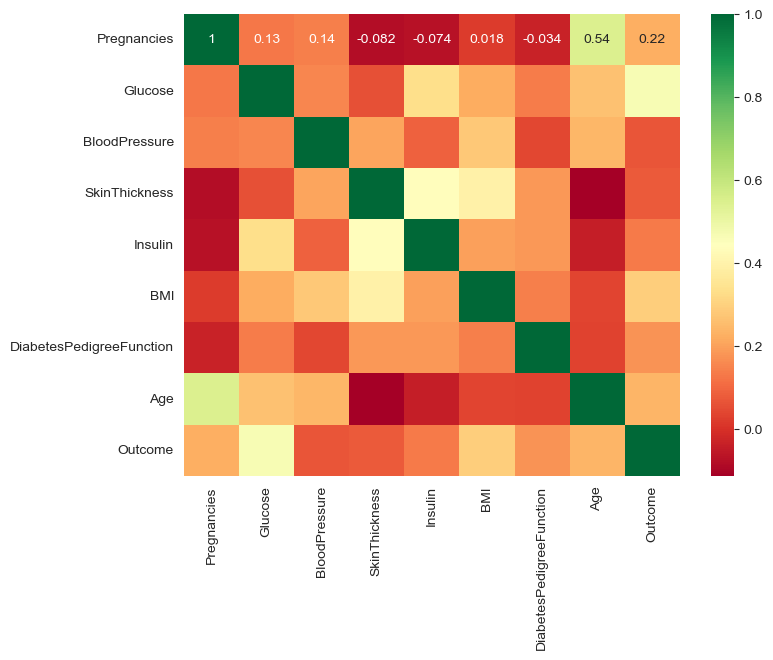

In [270]:
Corr = df.corr
plt.subplots(figsize=(8,6))
sns.heatmap(corr,cmap='RdYlGn', annot= True)
plt.show()

Pairplot of df

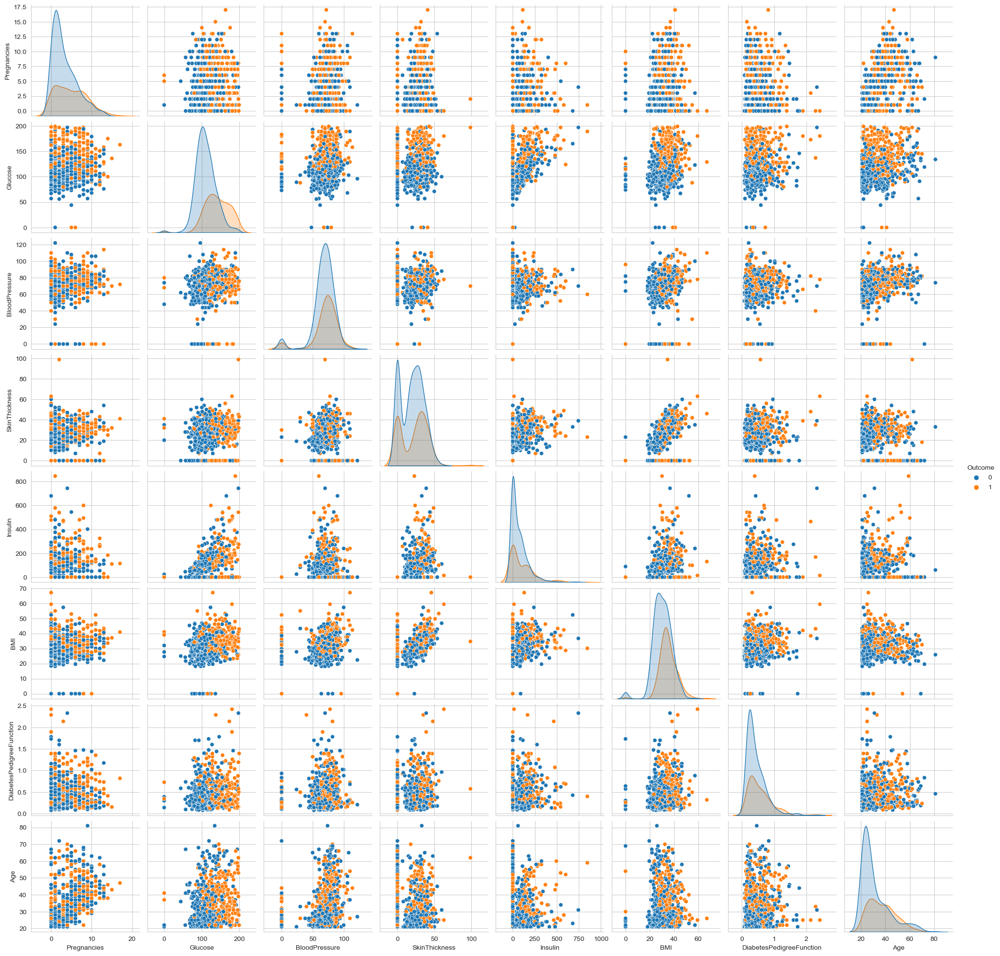

In [174]:
sns.pairplot(df, hue='Outcome')

BMI check

In [175]:
BMI_status = pd.Series([]) 

In [176]:
for i in range(len(df)): 
    if df['BMI'][i] == 0.0: 
        BMI_status[i]="NA"
    
    elif df['BMI'][i] < 18.5: 
        BMI_status[i]="Underweight"
        
    elif df['BMI'][i] < 25: 
        Nutritional_status[i]="Normal"
  
    elif df['BMI'][i] >= 25 and df['BMI'][i] < 30: 
        BMI_status[i]="Overweight"
  
    elif df['BMI'][i] >= 30: 
        BMI_status[i]="Obese"
        
    else: 
       BMI_status[i]= df['BMI'][i] 

In [177]:
df.insert(6,"BMI Status",BMI_status) 

In [178]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,BMI Status,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.60,Obese,0.63,50,1
1,1,85,66,29,0,26.60,Overweight,0.35,31,0
2,8,183,64,0,0,23.30,NaN,0.67,32,1
3,1,89,66,23,94,28.10,Overweight,0.17,21,0
4,0,137,40,35,168,43.10,Obese,2.29,33,1


In [179]:
df["BMI Status"].value_counts()

BMI Status
Obese          472
Overweight     179
NA              11
Underweight      4
Name: count, dtype: int64

11 women don't have information about BMI. Only 106 of 758 women have normal weight. Most of the women present overweight or obesity.

Glucose Check

In [180]:
GL_status = pd.Series([]) 

In [181]:
for i in range(len(df)): 
    if df['Glucose'][i] == 0.0: 
        GL_status [i]="NA"
    
    elif df['Glucose'][i] <= 140: 
        GL_status [i]="Normal"
    
    elif df['Glucose'][i] > 140 & df['Glucose'][i] <= 198: 
        GL_status [i]="Impaired Glucose Tolerance"
        
    elif df['Glucose'][i] > 198: 
        GL_status[i]="Diabetic Level"
        
    else: 
        GL_status [i]= df['Glucose'][i] 

In [182]:
df.insert(2, "Glucose Status", GL_status)

In [183]:
df.head()

,Pregnancies,Glucose,Glucose Status,BloodPressure,SkinThickness,Insulin,BMI,BMI Status,DiabetesPedigreeFunction,Age,Outcome
0,6,148,Impaired Glucose Tolerance,72,35,0,33.60,Obese,0.63,50,1
1,1,85,Normal,66,29,0,26.60,Overweight,0.35,31,0
2,8,183,Impaired Glucose Tolerance,64,0,0,23.30,NaN,0.67,32,1
3,1,89,Normal,66,23,94,28.10,Overweight,0.17,21,0
4,0,137,Normal,40,35,168,43.10,Obese,2.29,33,1


In [184]:
df["Glucose Status"].value_counts()

Glucose Status
Normal                        571
Impaired Glucose Tolerance    192
NA                              5
Name: count, dtype: int64

In fact, all glucose values ​​appear normal in the data.

Age check

In [185]:
df["Age"].value_counts()

Age
22    72
21    63
25    48
24    46
23    38
28    35
26    33
27    32
29    29
31    24
41    22
30    21
37    19
42    18
33    17
38    16
36    16
32    16
45    15
34    14
46    13
43    13
40    13
39    12
35    10
50     8
51     8
52     8
44     8
58     7
47     6
54     6
49     5
48     5
57     5
53     5
60     5
66     4
63     4
62     4
55     4
67     3
56     3
59     3
65     3
69     2
61     2
72     1
81     1
64     1
70     1
68     1
Name: count, dtype: int64

In [186]:
df.head()

,Pregnancies,Glucose,Glucose Status,BloodPressure,SkinThickness,Insulin,BMI,BMI Status,DiabetesPedigreeFunction,Age,Outcome
0,6,148,Impaired Glucose Tolerance,72,35,0,33.60,Obese,0.63,50,1
1,1,85,Normal,66,29,0,26.60,Overweight,0.35,31,0
2,8,183,Impaired Glucose Tolerance,64,0,0,23.30,NaN,0.67,32,1
3,1,89,Normal,66,23,94,28.10,Overweight,0.17,21,0
4,0,137,Normal,40,35,168,43.10,Obese,2.29,33,1


drop two columns that we inserted

In [187]:
df=df.drop(["Glucose Status","BMI Status"], axis=1)

In [188]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.60,0.63,50,1
1,1,85,66,29,0,26.60,0.35,31,0
2,8,183,64,0,0,23.30,0.67,32,1
3,1,89,66,23,94,28.10,0.17,21,0
4,0,137,40,35,168,43.10,2.29,33,1


We replace all data with 0 with NaN

In [189]:
df[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = \
df[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

missing values

In [190]:
df.isnull().values.any()

True

total missing values

In [191]:
df.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

df bar plot 

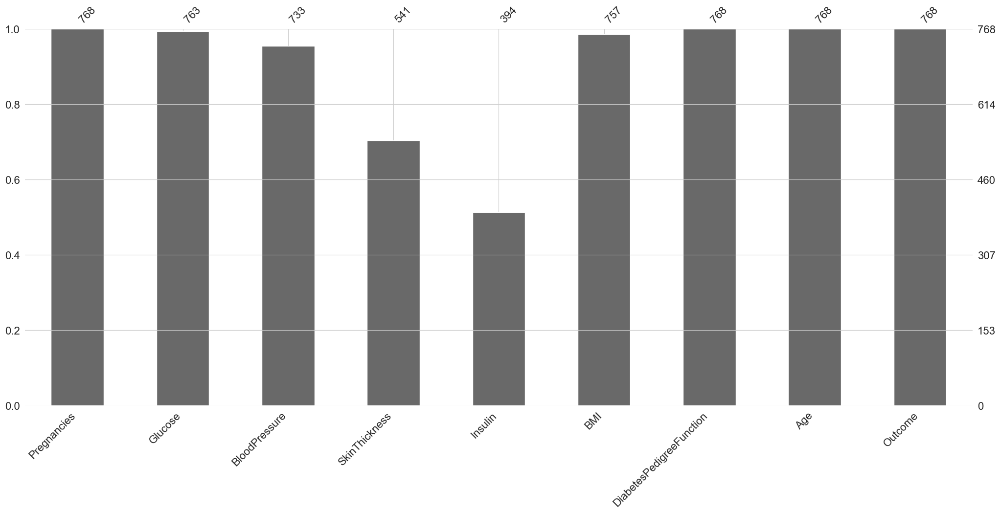

In [192]:
msno.bar(df)
plt.show()

hist plot

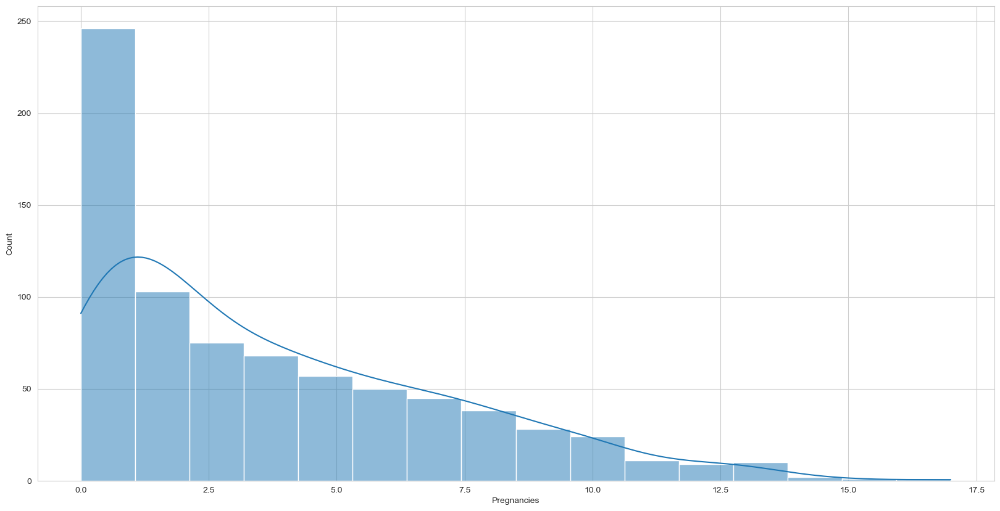

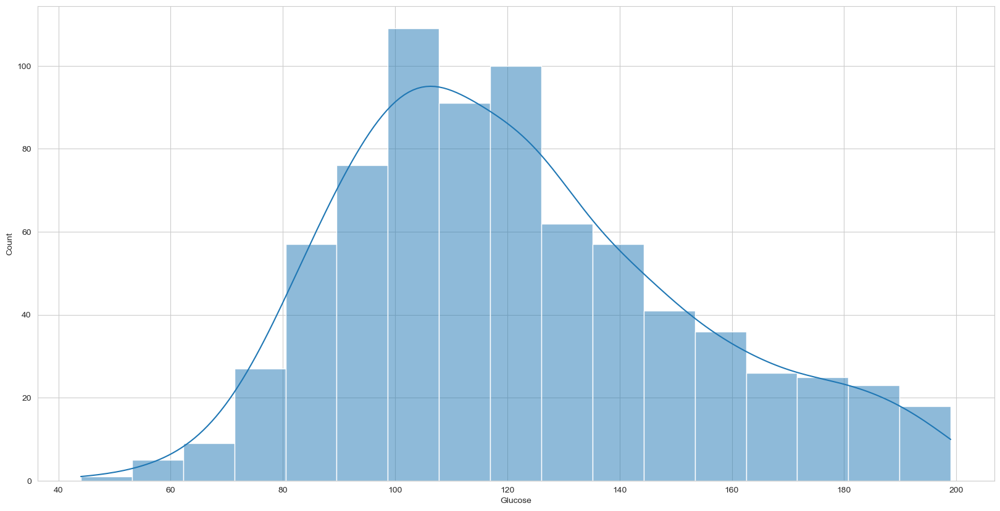

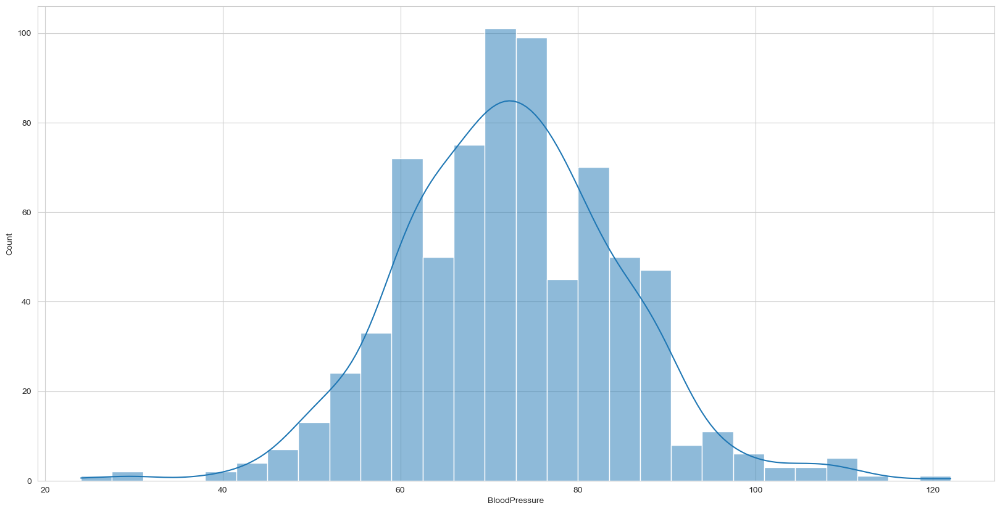

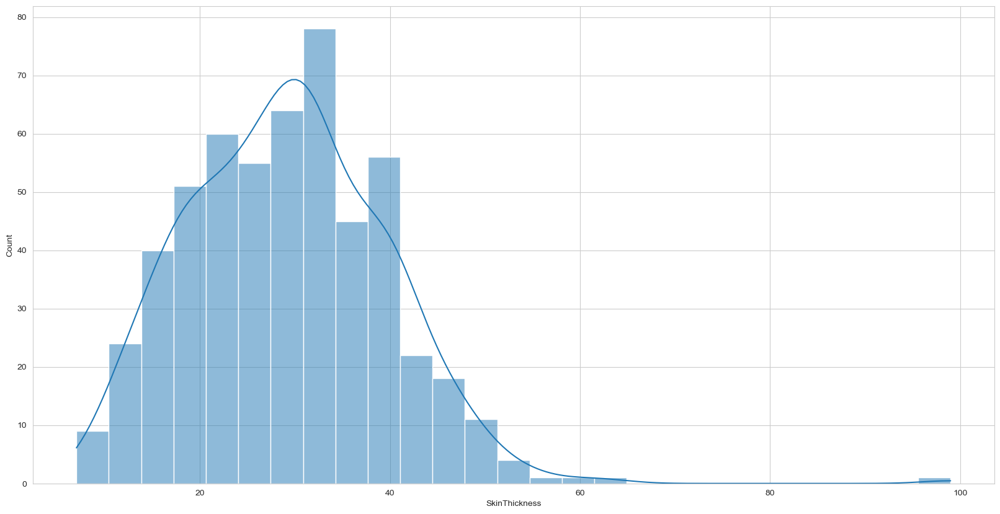

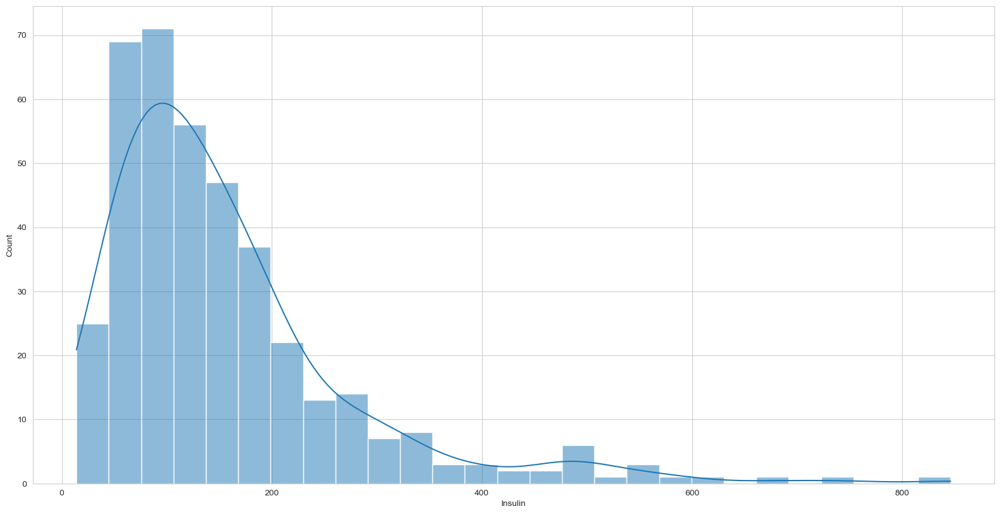

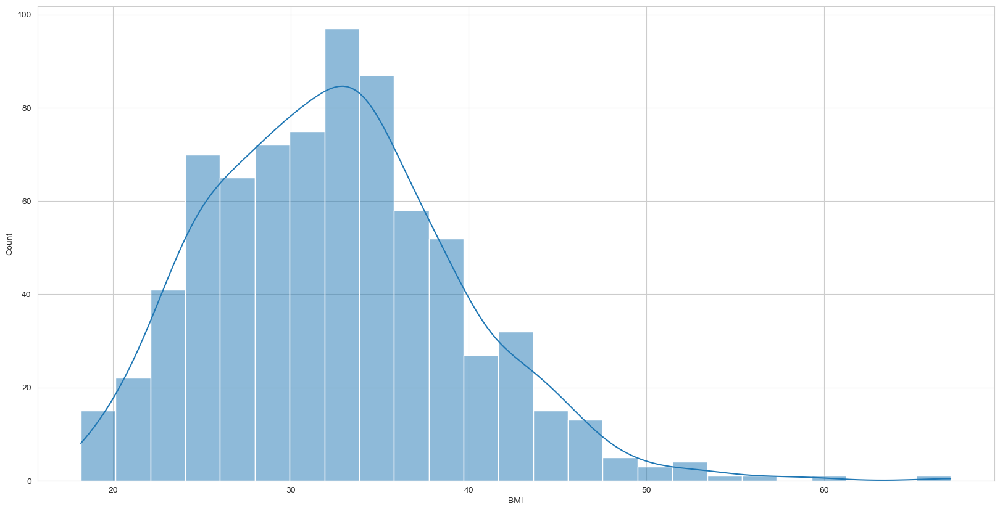

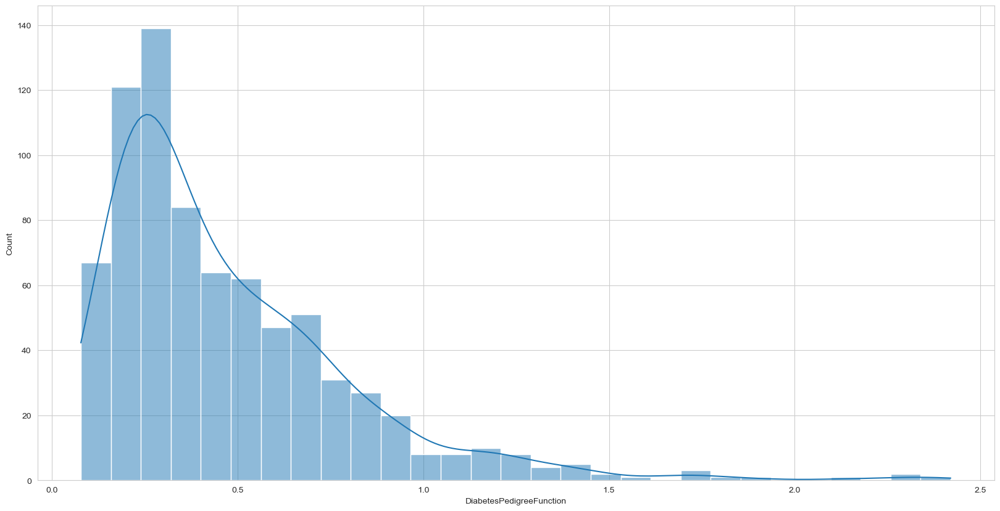

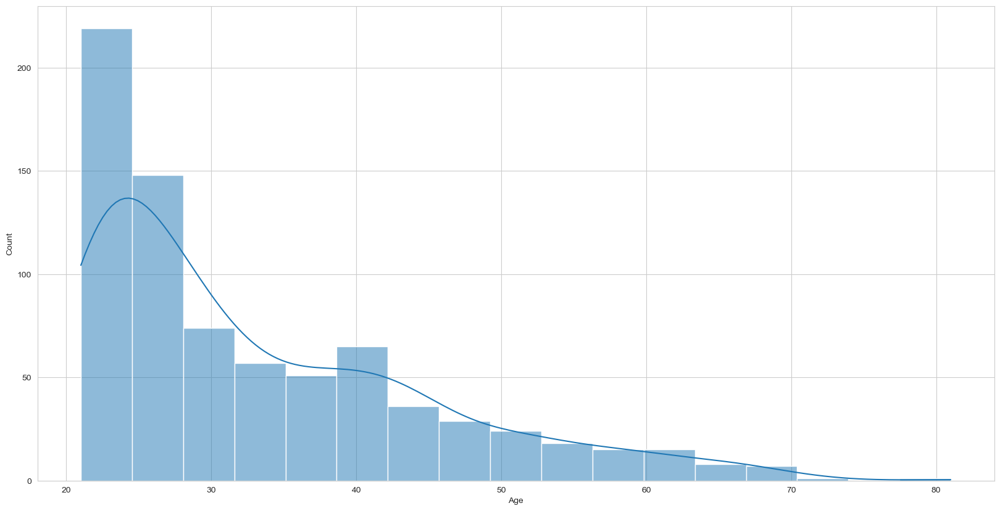

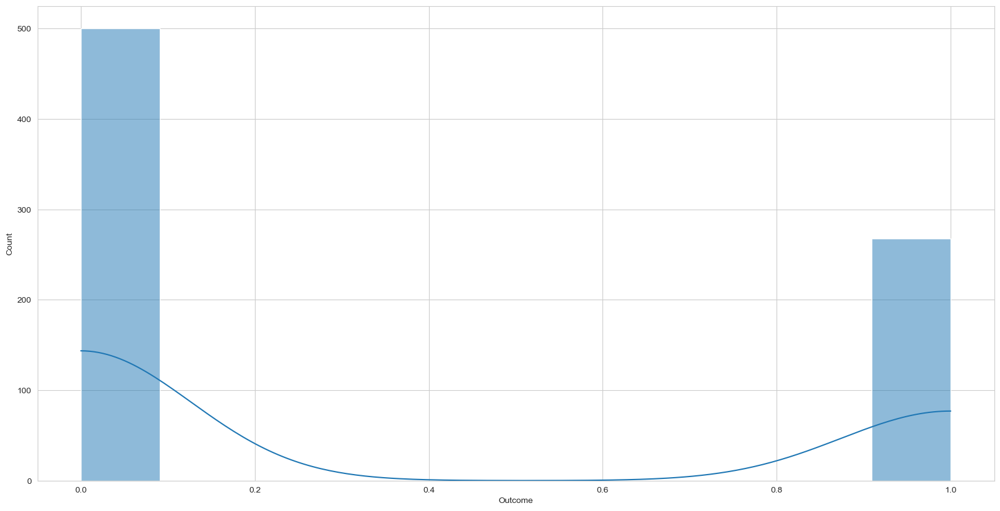

In [193]:
for x in df.columns:
    sns.histplot(df[x], kde=True)
    plt.show()

df sub plots

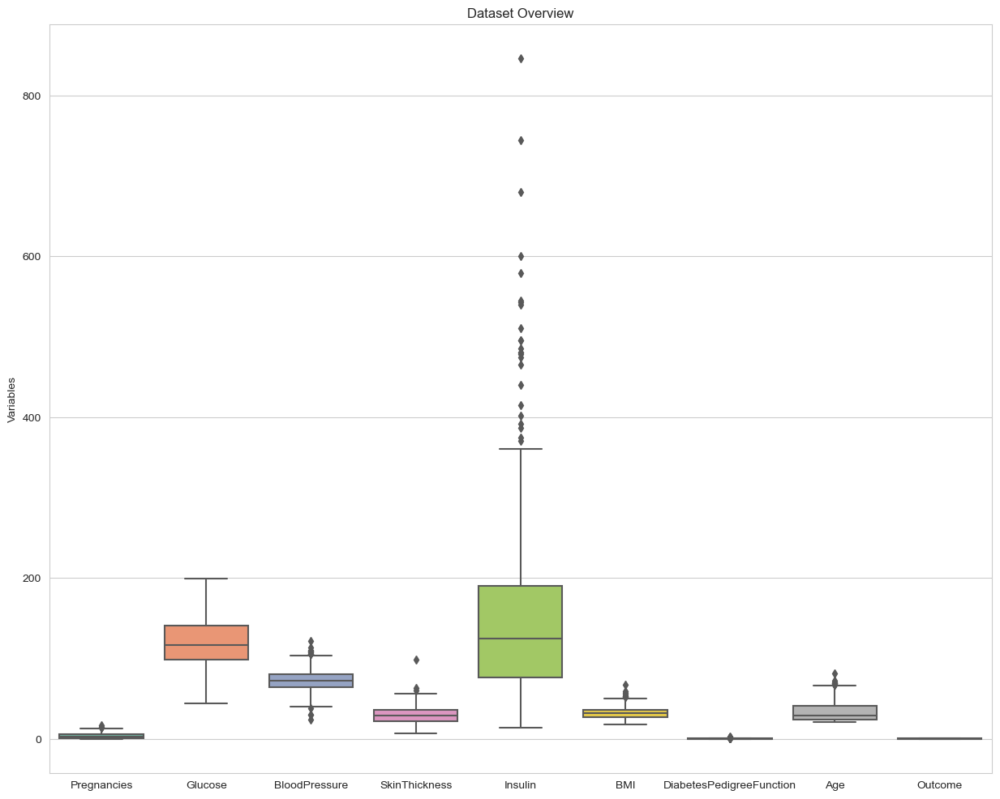

In [194]:
f, ax= plt.subplots(figsize=(15, 12))

ax.set(xlim=(-.05, 200))
plt.ylabel('Variables')
plt.title("Dataset Overview")
ax = sns.boxplot(data = df, orient = 'v', palette = 'Set2')

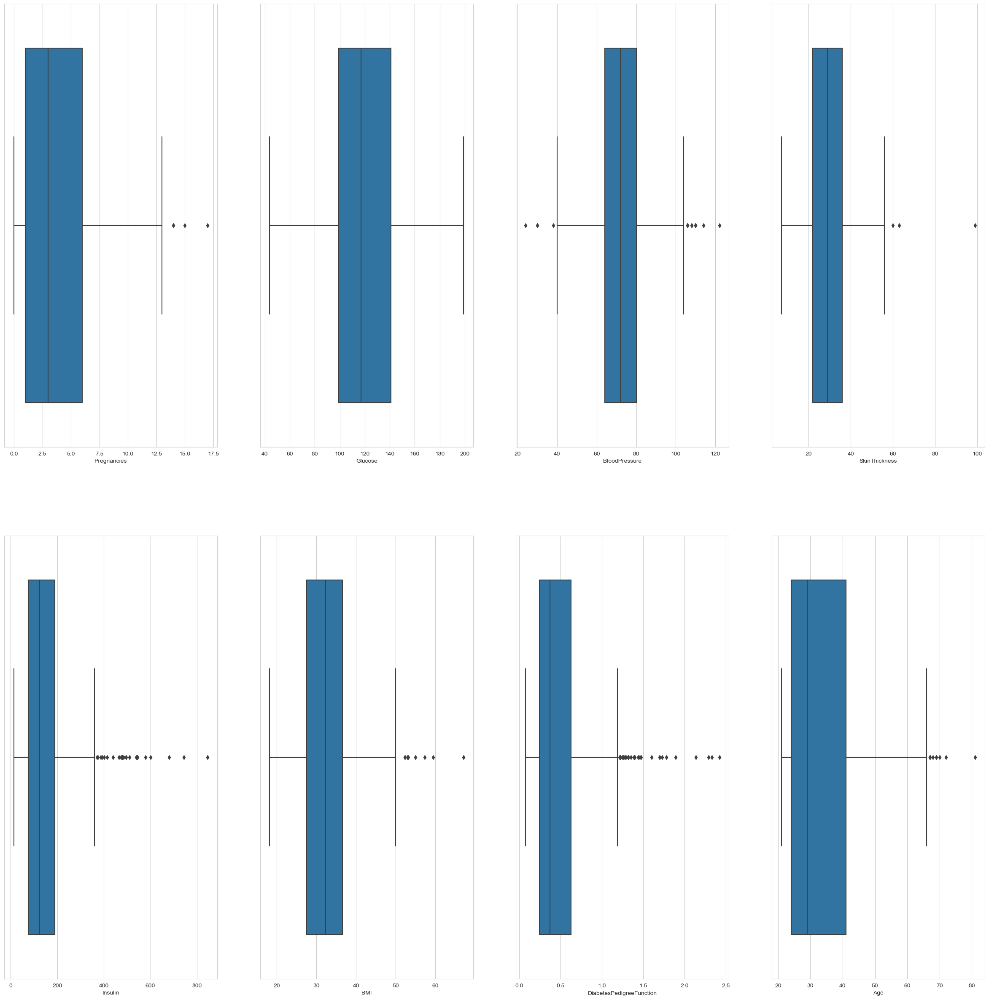

In [195]:
def boxes_plot(df):
    columns = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
           'BMI', 'DiabetesPedigreeFunction', 'Age'] 
    plt.figure(figsize=(30,30))
    for i in range(len(columns)):
        plt.subplot(2, 4, i+1)
        sns.boxplot(x=columns[i], data=df)
    plt.show()
    
boxes_plot(df)

array([[<Axes: title={'center': 'Pregnancies'}>,
        <Axes: title={'center': 'Glucose'}>,
        <Axes: title={'center': 'BloodPressure'}>],
       [<Axes: title={'center': 'SkinThickness'}>,
        <Axes: title={'center': 'Insulin'}>,
        <Axes: title={'center': 'BMI'}>],
       [<Axes: title={'center': 'DiabetesPedigreeFunction'}>,
        <Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Outcome'}>]], dtype=object)

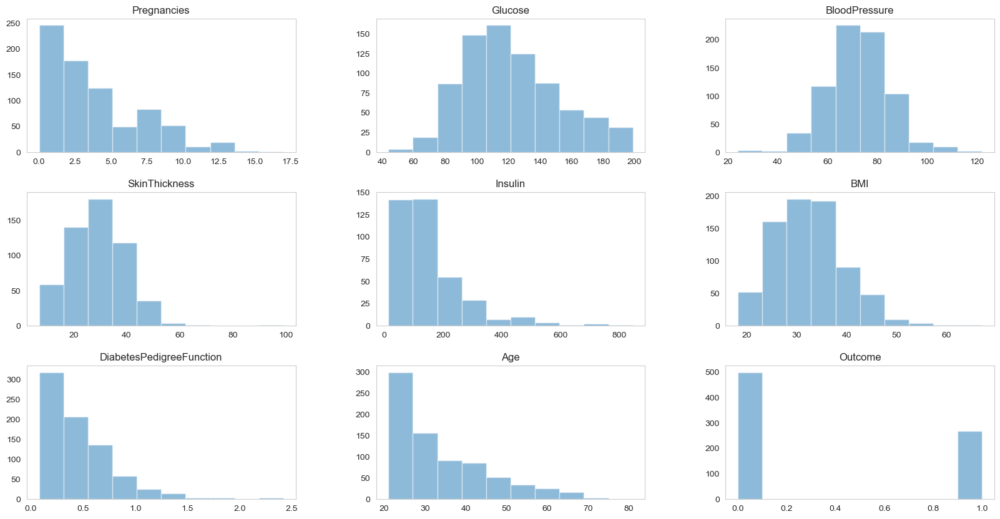

In [196]:
plt.rcParams["figure.figsize"] = (20, 10)
df.hist(grid=False, alpha=0.5)

<Axes: xlabel='Outcome', ylabel='count'>

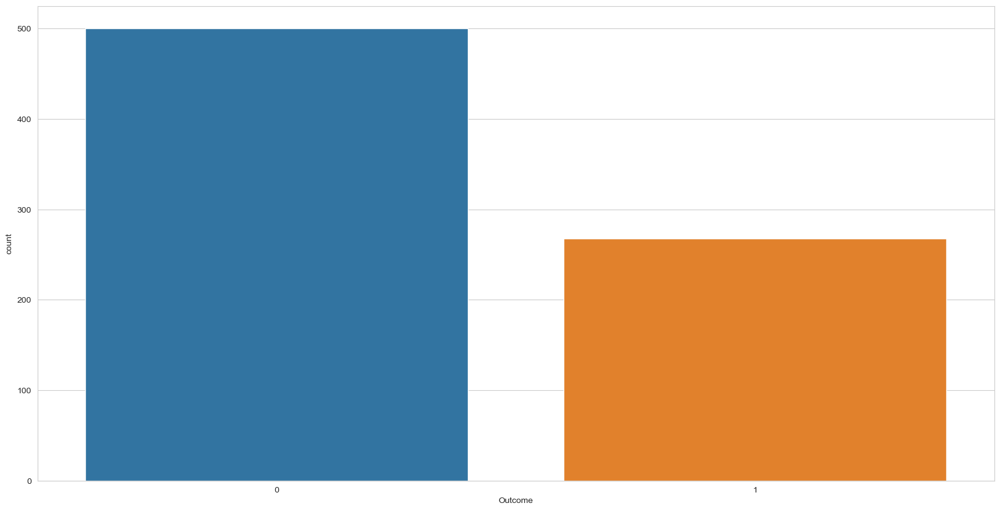

In [197]:
sns.countplot(x='Outcome', data=df,order=df['Outcome'].value_counts().index)

Text(0.5, 1.0, 'Glucose vs Blood Pressure')

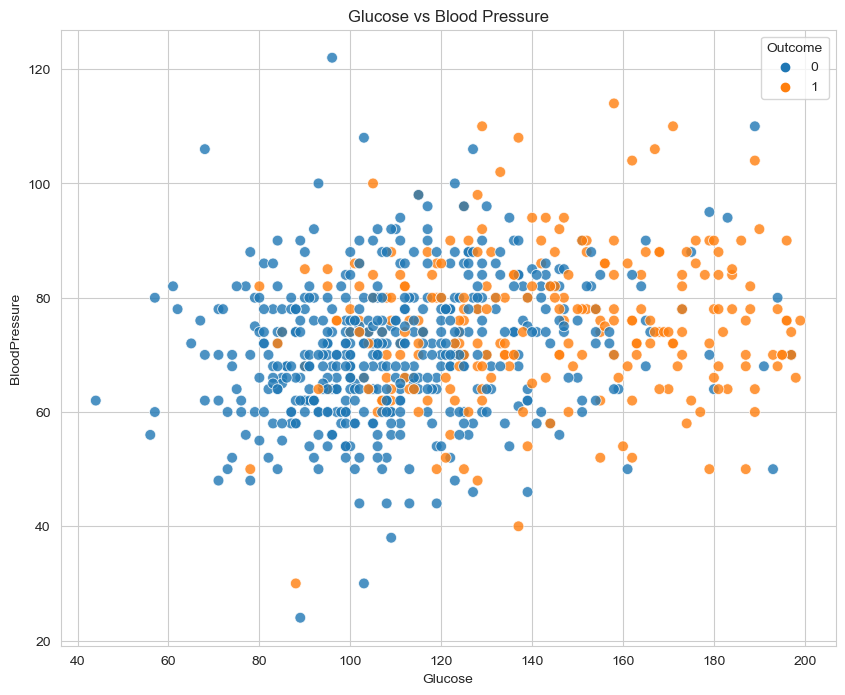

In [198]:
plt.rcParams["figure.figsize"] = (10, 8)
sns.scatterplot(x='Glucose', y='BloodPressure', hue='Outcome', data=df, s=60, alpha=0.8)
plt.title('Glucose vs Blood Pressure')

Text(0.5, 1.0, 'Insulin vs Blood Pressure')

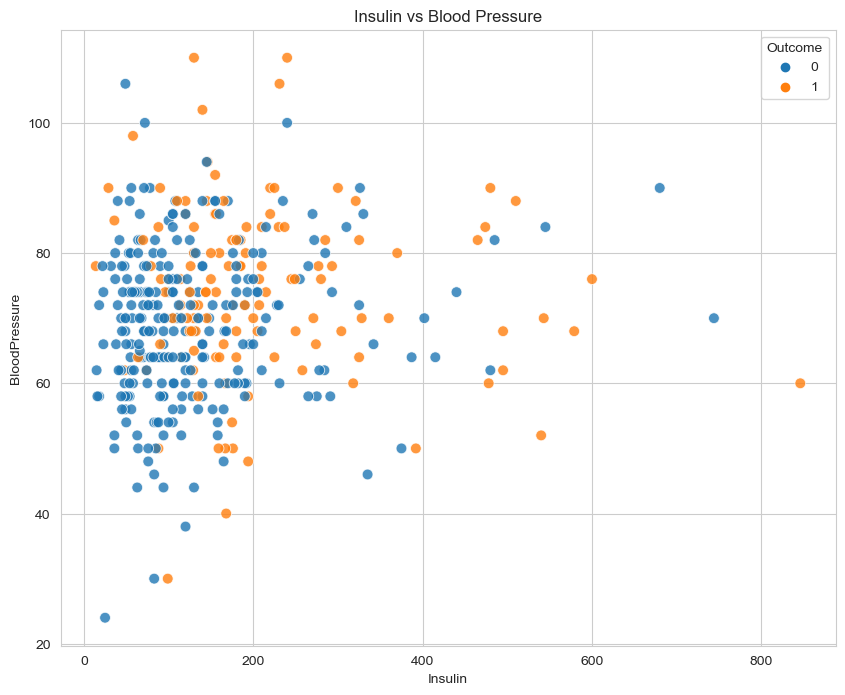

In [199]:
plt.rcParams["figure.figsize"] = (10, 8)
sns.scatterplot(x='Insulin', y='BloodPressure', hue='Outcome', data=df, s=60, alpha=0.8)
plt.title('Insulin vs Blood Pressure')

Text(0.5, 1.0, 'Glucose vs Age')

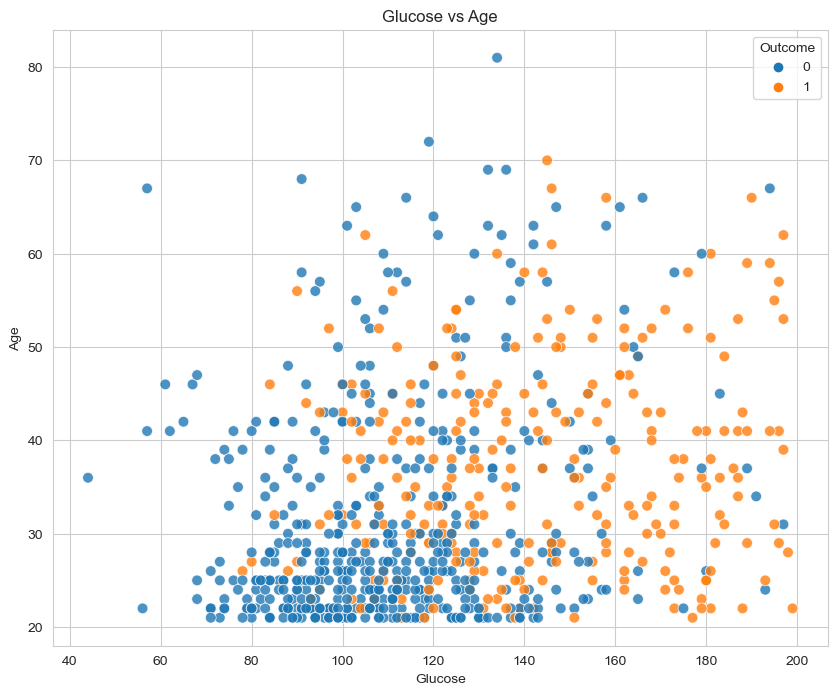

In [200]:
plt.rcParams["figure.figsize"] = (10, 8)
sns.scatterplot(x='Glucose', y='Age', hue='Outcome', data=df, s=60, alpha=0.8)
plt.title('Glucose vs Age')

Text(0.5, 1.0, 'BMI vs Age')

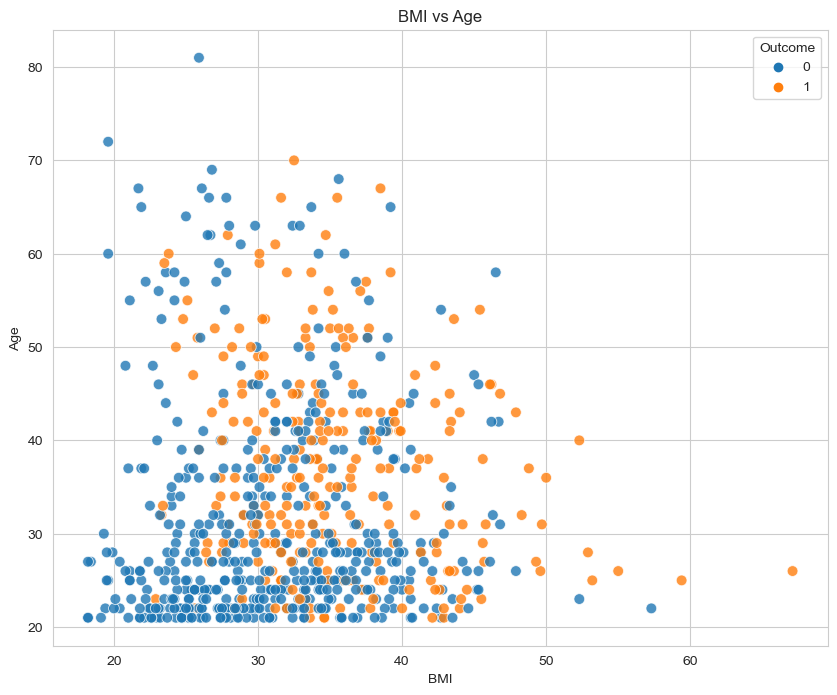

In [201]:
plt.rcParams["figure.figsize"] = (10, 8)
sns.scatterplot(x='BMI', y='Age', hue='Outcome', data=df, s=60, alpha=0.8)
plt.title('BMI vs Age')

Text(0.5, 1.0, 'Skin Thickness vs DPF')

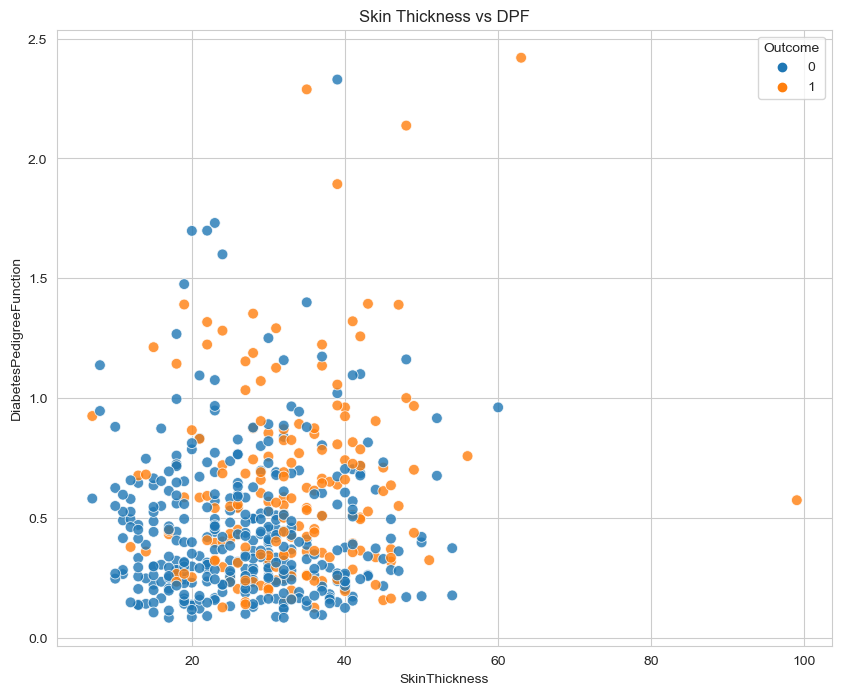

In [202]:
plt.rcParams["figure.figsize"] = (10, 8)
sns.scatterplot(x='SkinThickness', y='DiabetesPedigreeFunction', hue='Outcome', data=df, s=60, alpha=0.8)
plt.title('Skin Thickness vs DPF')

Text(0.5, 1.0, 'Skin Thickness vs Insulin')

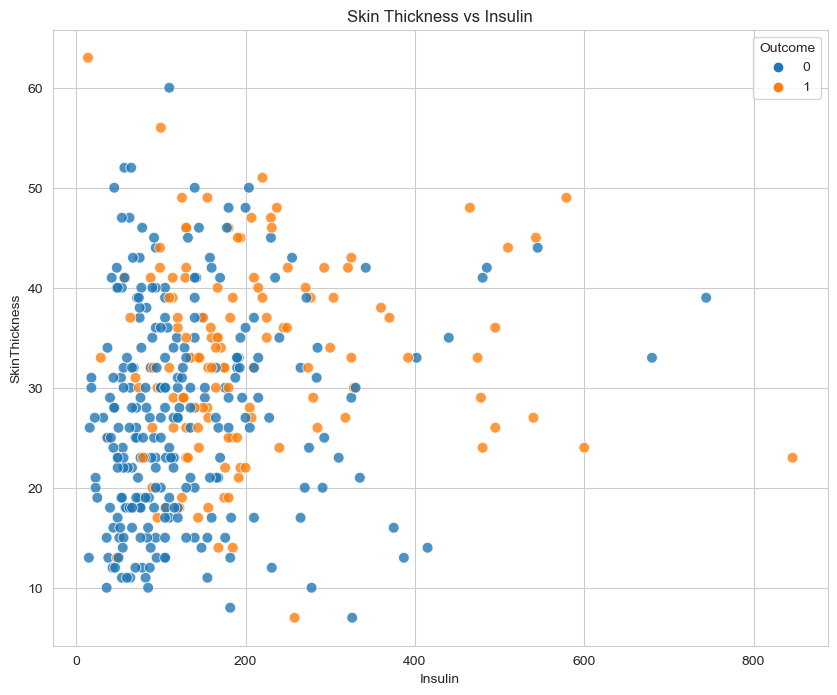

In [203]:
plt.rcParams["figure.figsize"] = (10, 8)
sns.scatterplot(y='SkinThickness', x='Insulin', hue='Outcome', data=df, s=60, alpha=0.8)
plt.title('Skin Thickness vs Insulin')

<Figure size 800x800 with 0 Axes>

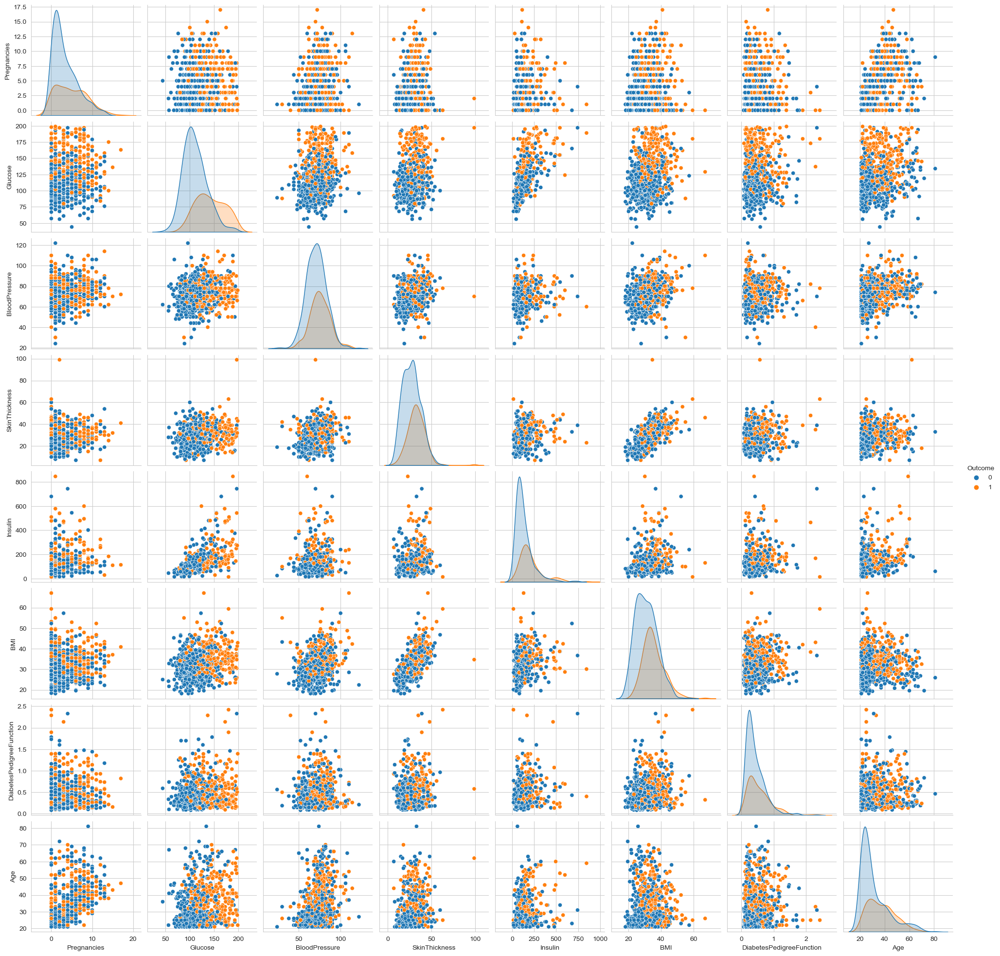

In [204]:
plt.figure(figsize=(8, 8))
sns.set_style("whitegrid")
sns.pairplot(df,hue='Outcome');
plt.show()

delete Outlier

In [205]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Pregnancies                  5.00
Glucose                     42.00
BloodPressure               16.00
SkinThickness               14.00
Insulin                    113.75
BMI                          9.10
DiabetesPedigreeFunction     0.38
Age                         17.00
Outcome                      1.00
dtype: float64


In [206]:
df = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [207]:
df.shape

(684, 9)

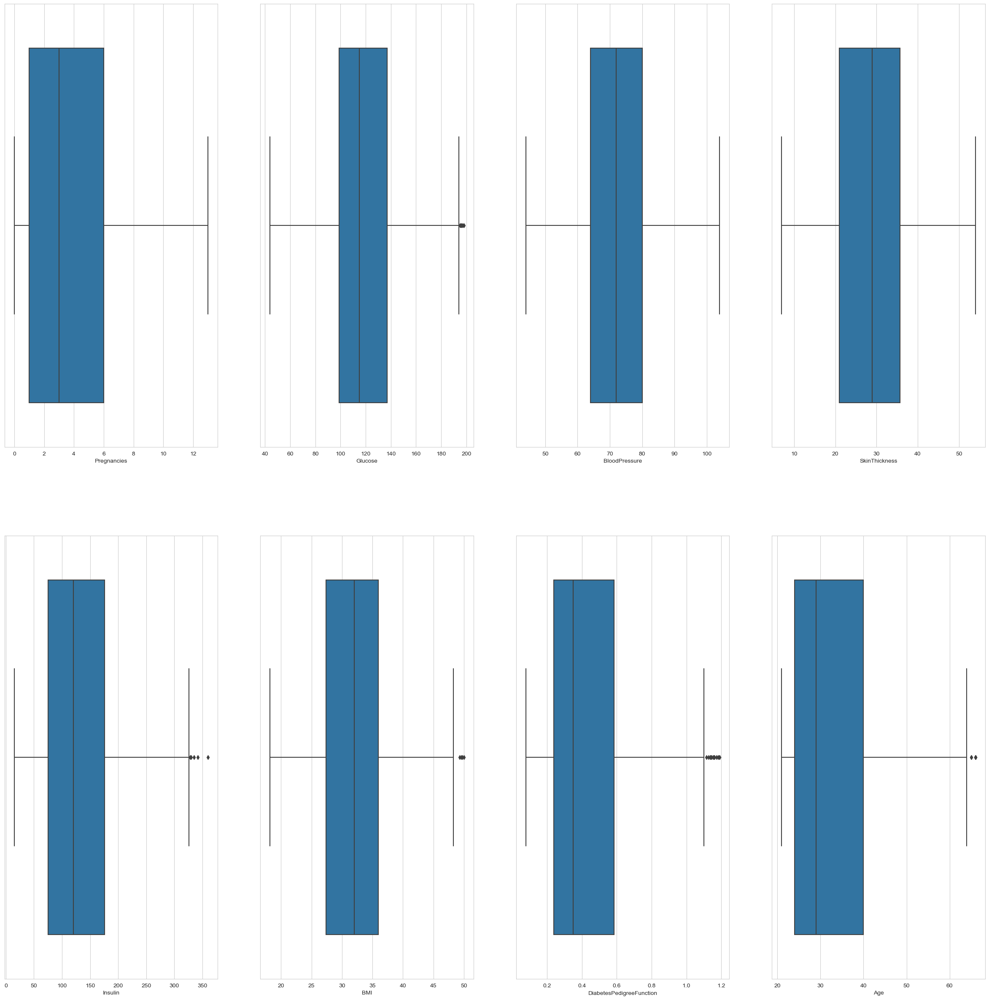

In [208]:
def boxes_plot(df):
    columns = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
           'BMI', 'DiabetesPedigreeFunction', 'Age'] 
    plt.figure(figsize=(30,30))
    for i in range(len(columns)):
        plt.subplot(2, 4, i+1)
        sns.boxplot(x=columns[i], data=df)
    plt.show()
    
boxes_plot(df)

In [209]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,684.00,3.78,3.25,0.00,1.00,3.00,6.00,13.00
Glucose,679.00,119.43,29.11,44.00,99.00,115.00,137.00,198.00
BloodPressure,651.00,72.02,11.11,44.00,64.00,72.00,80.00,104.00
SkinThickness,474.00,28.55,9.77,7.00,21.00,29.00,35.75,54.00
Insulin,339.00,132.63,74.46,15.00,75.00,120.00,176.00,360.00
BMI,675.00,31.98,6.41,18.20,27.35,32.00,35.95,50.00
DiabetesPedigreeFunction,684.00,0.43,0.25,0.08,0.24,0.35,0.58,1.19
Age,684.00,32.54,10.98,21.00,24.00,29.00,40.00,66.00
Outcome,684.00,0.32,0.47,0.00,0.00,0.00,1.00,1.00


In [210]:
df.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                33
SkinThickness               210
Insulin                     345
BMI                           9
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [211]:
scaler = MinMaxScaler()
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

imputer = KNNImputer(n_neighbors=5)
df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

df = pd.DataFrame(scaler.inverse_transform(df), columns=df.columns)
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.00,148.00,72.00,35.00,206.20,33.60,0.63,50.00,1.00
1,1.00,85.00,66.00,29.00,57.20,26.60,0.35,31.00,0.00
2,8.00,183.00,64.00,31.20,193.80,23.30,0.67,32.00,1.00
3,1.00,89.00,66.00,23.00,94.00,28.10,0.17,21.00,0.00
4,5.00,116.00,74.00,23.00,116.60,25.60,0.20,30.00,0.00


In [212]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [213]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,684.00,3.78,3.25,0.00,1.00,3.00,6.00,13.00
Glucose,684.00,119.44,29.13,44.00,99.00,115.00,137.25,198.00
BloodPressure,684.00,71.94,10.94,44.00,64.00,72.00,80.00,104.00
SkinThickness,684.00,28.67,8.82,7.00,22.75,29.00,34.20,54.00
Insulin,684.00,132.61,61.62,15.00,87.35,125.00,170.00,360.00
BMI,684.00,31.96,6.38,18.20,27.38,32.00,35.90,50.00
DiabetesPedigreeFunction,684.00,0.43,0.25,0.08,0.24,0.35,0.58,1.19
Age,684.00,32.54,10.98,21.00,24.00,29.00,40.00,66.00
Outcome,684.00,0.32,0.47,0.00,0.00,0.00,1.00,1.00


In [214]:
df_.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.00,3.85,3.37,0.00,1.00,3.00,6.00,17.00
Glucose,768.00,120.89,31.97,0.00,99.00,117.00,140.25,199.00
BloodPressure,768.00,69.11,19.36,0.00,62.00,72.00,80.00,122.00
SkinThickness,768.00,20.54,15.95,0.00,0.00,23.00,32.00,99.00
Insulin,768.00,79.80,115.24,0.00,0.00,30.50,127.25,846.00
BMI,768.00,31.99,7.88,0.00,27.30,32.00,36.60,67.10
DiabetesPedigreeFunction,768.00,0.47,0.33,0.08,0.24,0.37,0.63,2.42
Age,768.00,33.24,11.76,21.00,24.00,29.00,41.00,81.00
Outcome,768.00,0.35,0.48,0.00,0.00,0.00,1.00,1.00


In [215]:
outcome =df['Outcome'].value_counts()
print(outcome)

Outcome
0.00    462
1.00    222
Name: count, dtype: int64


array([[<Axes: title={'center': 'Pregnancies'}>,
        <Axes: title={'center': 'Glucose'}>,
        <Axes: title={'center': 'BloodPressure'}>],
       [<Axes: title={'center': 'SkinThickness'}>,
        <Axes: title={'center': 'Insulin'}>,
        <Axes: title={'center': 'BMI'}>],
       [<Axes: title={'center': 'DiabetesPedigreeFunction'}>,
        <Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Outcome'}>]], dtype=object)

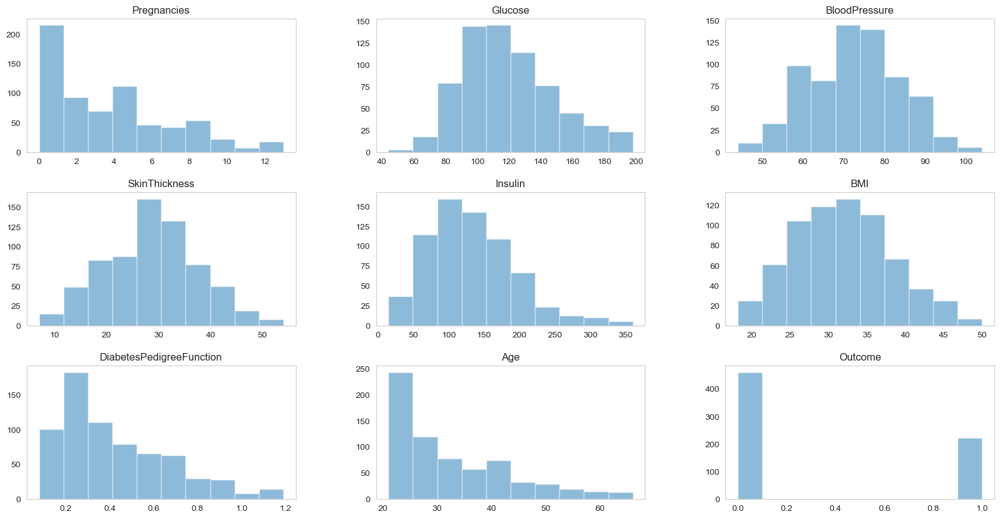

In [216]:
plt.rcParams["figure.figsize"] = (20, 10)
df.hist(grid=False, alpha=0.5)

array([[<Axes: title={'center': 'Pregnancies'}>,
        <Axes: title={'center': 'Glucose'}>,
        <Axes: title={'center': 'BloodPressure'}>],
       [<Axes: title={'center': 'SkinThickness'}>,
        <Axes: title={'center': 'Insulin'}>,
        <Axes: title={'center': 'BMI'}>],
       [<Axes: title={'center': 'DiabetesPedigreeFunction'}>,
        <Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Outcome'}>]], dtype=object)

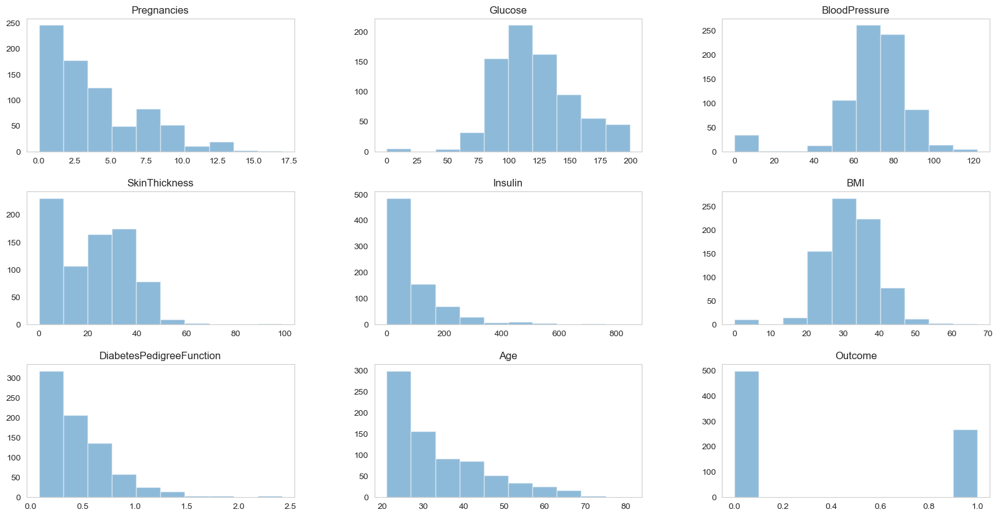

In [217]:
plt.rcParams["figure.figsize"] = (20, 10)
df_.hist(grid=False, alpha=0.5)

Text(0.5, 1.0, 'Glucose vs Blood Pressure')

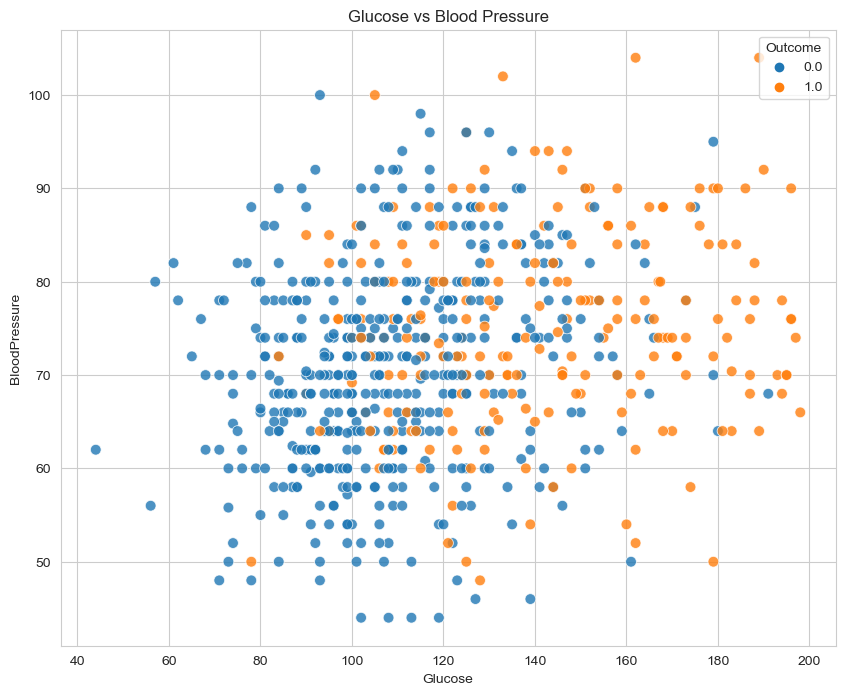

In [259]:
plt.rcParams["figure.figsize"] = (10, 8)
sns.scatterplot(x='Glucose', y='BloodPressure', hue='Outcome', data=df, s=60, alpha=0.8)
plt.title('Glucose vs Blood Pressure')

Text(0.5, 1.0, 'Skin Thickness vs Insulin')

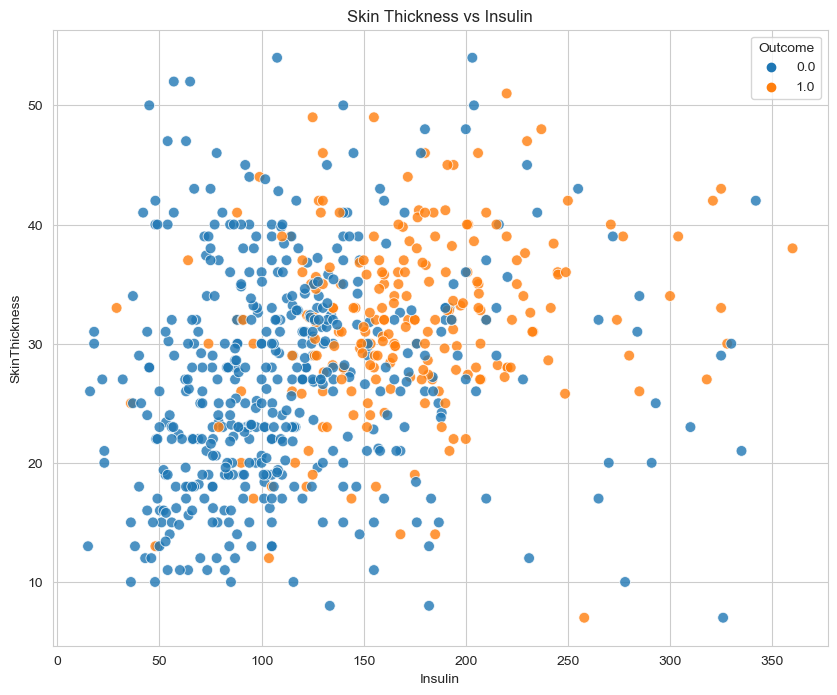

In [260]:
plt.rcParams["figure.figsize"] = (10, 8)
sns.scatterplot(y='SkinThickness', x='Insulin', hue='Outcome', data=df, s=60, alpha=0.8)
plt.title('Skin Thickness vs Insulin')

In [218]:
df_ml[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = \
df_ml[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

In [219]:
df_ml.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [220]:
scaler = MinMaxScaler()
df_ml = pd.DataFrame(scaler.fit_transform(df_ml), columns=df_ml.columns)

imputer = KNNImputer(n_neighbors=5)
df_ml = pd.DataFrame(imputer.fit_transform(df_ml), columns=df_ml.columns)

df_ml = pd.DataFrame(scaler.inverse_transform(df_ml), columns=df_ml.columns)
df_ml.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.00,148.00,72.00,35.00,334.20,33.60,0.63,50.00,1.00
1,1.00,85.00,66.00,29.00,56.20,26.60,0.35,31.00,0.00
2,8.00,183.00,64.00,32.20,238.00,23.30,0.67,32.00,1.00
3,1.00,89.00,66.00,23.00,94.00,28.10,0.17,21.00,0.00
4,0.00,137.00,40.00,35.00,168.00,43.10,2.29,33.00,1.00


In [221]:
df_ml.shape

(768, 9)

In [222]:
df_ml.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [223]:
Q1 = df_ml.quantile(0.25)
Q3 = df_ml.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Pregnancies                 5.00
Glucose                    42.00
BloodPressure              16.00
SkinThickness              12.05
Insulin                    99.60
BMI                         9.20
DiabetesPedigreeFunction    0.38
Age                        17.00
Outcome                     1.00
dtype: float64


In [224]:
df_ml = df_ml[~((df_ml < (Q1 - 1.5 * IQR)) | (df_ml > (Q3 + 1.5 * IQR))).any(axis=1)]

In [225]:
df_ml.shape

(679, 9)

In [226]:
df_ml.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,679.00,3.77,3.24,0.00,1.00,3.00,6.00,13.00
Glucose,679.00,119.32,29.16,44.00,99.00,114.00,137.00,198.00
BloodPressure,679.00,71.90,10.97,44.00,64.00,72.00,80.00,104.00
SkinThickness,679.00,28.53,8.74,7.00,22.20,28.80,34.10,52.00
Insulin,679.00,138.56,69.89,15.00,85.90,126.00,179.70,335.00
BMI,679.00,31.94,6.40,18.20,27.30,32.00,35.90,50.00
DiabetesPedigreeFunction,679.00,0.43,0.25,0.08,0.24,0.35,0.58,1.19
Age,679.00,32.49,10.96,21.00,24.00,29.00,39.00,66.00
Outcome,679.00,0.32,0.47,0.00,0.00,0.00,1.00,1.00


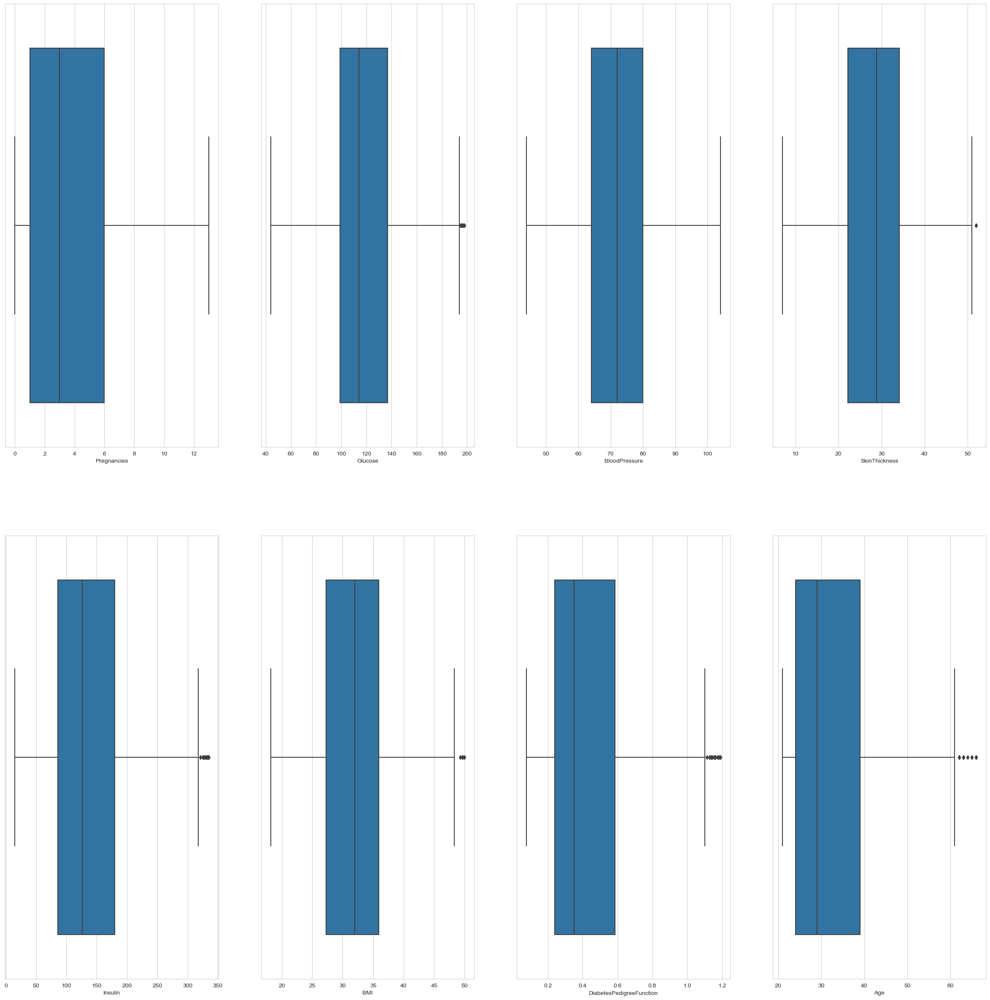

In [227]:
def boxes_plot(df_ml):
    columns = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
           'BMI', 'DiabetesPedigreeFunction', 'Age'] 
    plt.figure(figsize=(30,30))
    for i in range(len(columns)):
        plt.subplot(2, 4, i+1)
        sns.boxplot(x=columns[i], data=df_ml)
    plt.show()
    
boxes_plot(df_ml)

In [228]:
Q1 = df_ot.quantile(0.25)
Q3 = df_ot.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Pregnancies                  5.00
Glucose                     41.25
BloodPressure               18.00
SkinThickness               32.00
Insulin                    127.25
BMI                          9.30
DiabetesPedigreeFunction     0.38
Age                         17.00
Outcome                      1.00
dtype: float64


In [229]:
df_ot = df_ot[~((df_ot < (Q1 - 1.5 * IQR)) | (df_ot > (Q3 + 1.5 * IQR))).any(axis=1)]

In [230]:
df_ot.shape

(639, 9)

In [231]:
df_ot[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = \
df_ot[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

In [232]:
df_ot.isnull().sum()

Pregnancies                   0
Glucose                       0
BloodPressure                 0
SkinThickness               179
Insulin                     307
BMI                           0
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [233]:
scaler = MinMaxScaler()
df_ot = pd.DataFrame(scaler.fit_transform(df_ot), columns=df_ot.columns)

imputer = KNNImputer(n_neighbors=5)
df_ot = pd.DataFrame(imputer.fit_transform(df_ot), columns=df_ot.columns)

df_ot = pd.DataFrame(scaler.inverse_transform(df_ot), columns=df_ot.columns)
df_ot.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.00,148.00,72.00,35.00,188.60,33.60,0.63,50.00,1.00
1,1.00,85.00,66.00,29.00,57.20,26.60,0.35,31.00,0.00
2,8.00,183.00,64.00,27.40,155.20,23.30,0.67,32.00,1.00
3,1.00,89.00,66.00,23.00,94.00,28.10,0.17,21.00,0.00
4,5.00,116.00,74.00,23.00,111.00,25.60,0.20,30.00,0.00


In [234]:
df_ot.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [235]:
df_ot.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,639.00,3.80,3.26,0.00,1.00,3.00,6.00,13.00
Glucose,639.00,119.11,29.16,44.00,99.00,114.00,137.00,198.00
BloodPressure,639.00,72.12,11.35,38.00,64.00,72.00,80.00,106.00
SkinThickness,639.00,28.78,9.01,7.00,22.60,29.00,35.00,60.00
Insulin,639.00,127.38,55.97,15.00,87.00,120.80,160.40,318.00
BMI,639.00,32.01,6.43,18.20,27.30,32.00,35.95,50.00
DiabetesPedigreeFunction,639.00,0.43,0.25,0.08,0.24,0.36,0.59,1.19
Age,639.00,32.72,11.08,21.00,24.00,29.00,40.00,66.00
Outcome,639.00,0.31,0.46,0.00,0.00,0.00,1.00,1.00


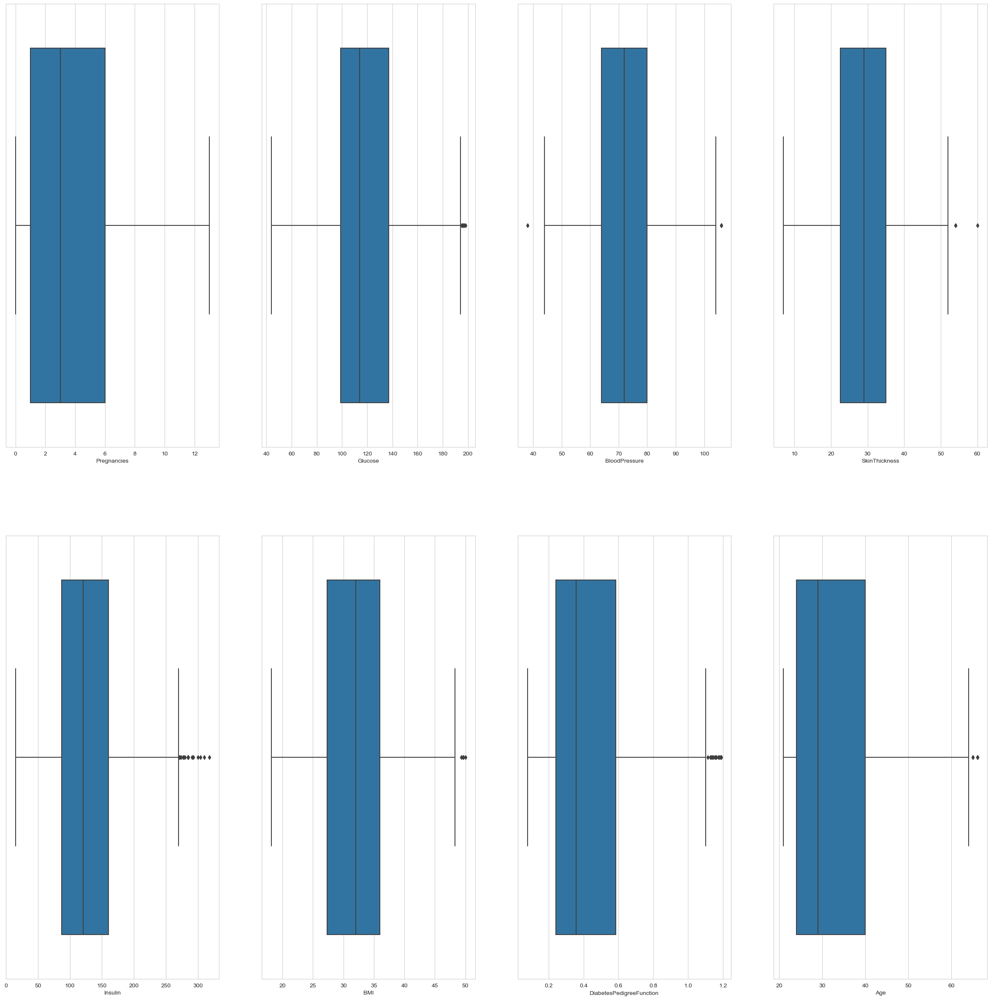

In [236]:
def boxes_plot(df_ot):
    columns = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
           'BMI', 'DiabetesPedigreeFunction', 'Age'] 
    plt.figure(figsize=(30,30))
    for i in range(len(columns)):
        plt.subplot(2, 4, i+1)
        sns.boxplot(x=columns[i], data=df_ot)
    plt.show()
    
boxes_plot(df_ot)

<Figure size 800x800 with 0 Axes>

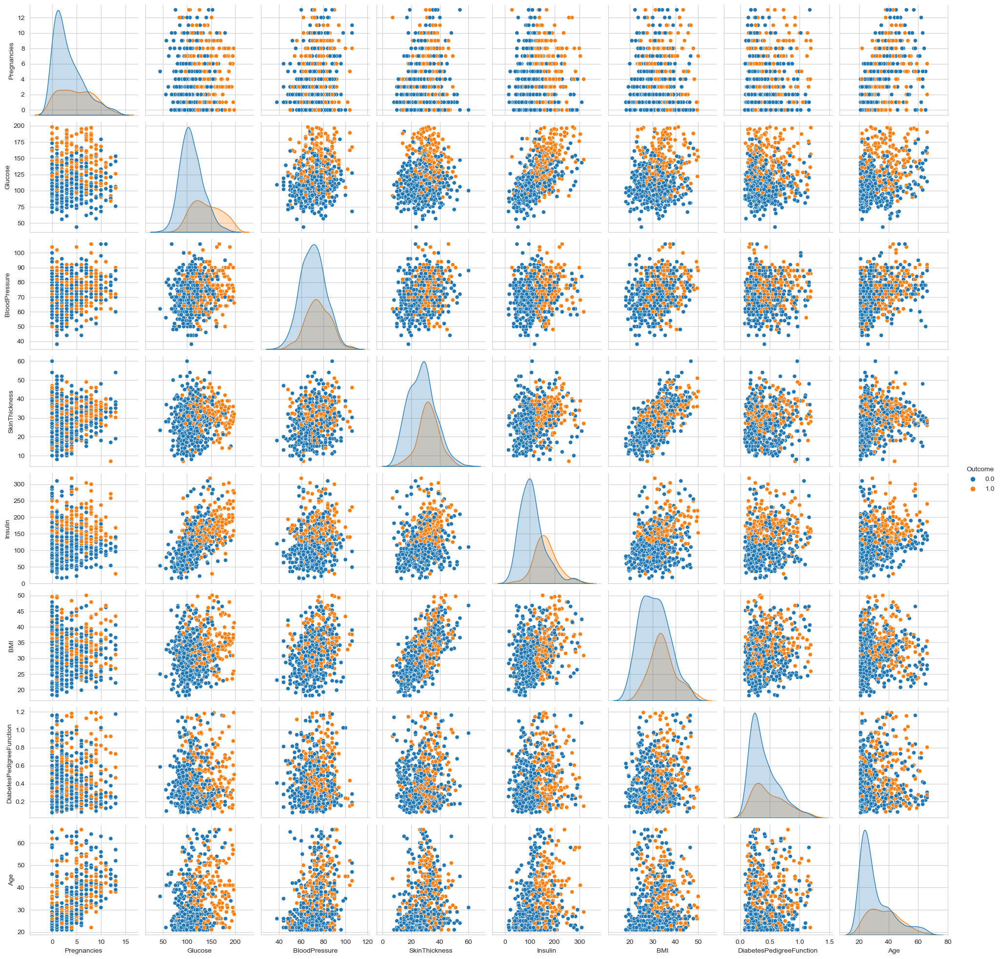

In [237]:
plt.figure(figsize=(8, 8))
sns.set_style("whitegrid")
sns.pairplot(df_ot,hue='Outcome');
plt.show()

In [264]:
# X = df.drop('Outcome', axis=1)
# y = df['Outcome']


# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# print ("X_train: ", X_train.shape)
# print ("y_train: ", y_train.shape)
# print("X_test: ", X_test.shape)
# print ("y_test: ", y_test.shape)

X_train:  (547, 8)
y_train:  (547,)
X_test:  (137, 8)
y_test:  (137,)


In [265]:
# X = df_ml.drop('Outcome', axis=1)
# y = df_ml['Outcome']


# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# print ("X_train: ", X_train.shape)
# print ("y_train: ", y_train.shape)
# print("X_test: ", X_test.shape)
# print ("y_test: ", y_test.shape)

X_train:  (543, 8)
y_train:  (543,)
X_test:  (136, 8)
y_test:  (136,)


In [267]:
X = df_ot.drop('Outcome', axis=1)
y = df_ot['Outcome']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print ("X_train: ", X_train.shape)
print ("y_train: ", y_train.shape)
print("X_test: ", X_test.shape)
print ("y_test: ", y_test.shape)

X_train:  (511, 8)
y_train:  (511,)
X_test:  (128, 8)
y_test:  (128,)


In [268]:
clf = LazyClassifier(ignore_warnings=True, custom_metric=None)
models, predictions = clf.fit(X_train, X_test, y_train, y_test)

print(models)

 97%|███████████████████████████████████████████████████████████████████████████████▏  | 28/29 [00:02<00:00, 11.97it/s]

[LightGBM] [Info] Number of positive: 164, number of negative: 347
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 699
[LightGBM] [Info] Number of data points in the train set: 511, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.320939 -> initscore=-0.749458
[LightGBM] [Info] Start training from score -0.749458
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:02<00:00, 10.99it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

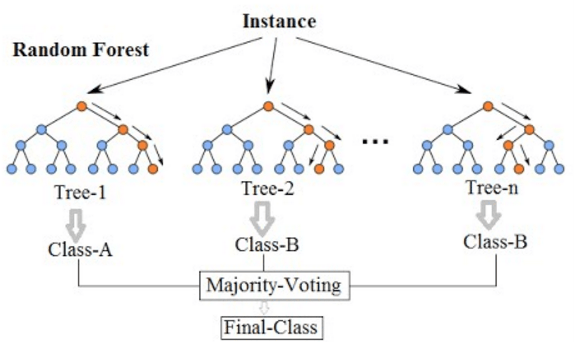

In [242]:
etc_model=ExtraTreesClassifier()
etc_model.fit(X_train,y_train)
pred_etc=etc_model.predict(X_test)
pred_etc

array([0., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0.,
       0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       1., 0., 1., 1., 1., 0., 0., 1., 0., 0., 1., 0., 0., 1., 1., 0., 0.,
       1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 0.,
       1., 1., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       1., 0., 0., 0., 1., 0., 0., 0., 0.])

Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.86      0.88      0.87        92
    Diabetes       0.68      0.64      0.66        36

    accuracy                           0.81       128
   macro avg       0.77      0.76      0.76       128
weighted avg       0.81      0.81      0.81       128

[[81 11]
 [13 23]]


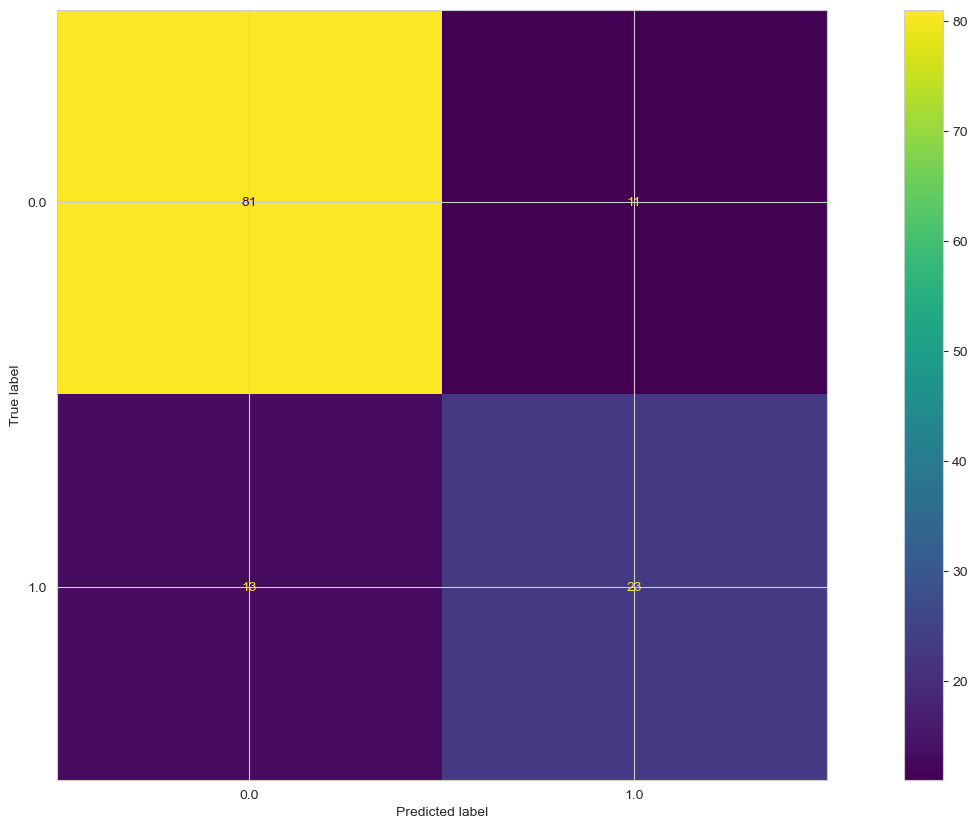

In [243]:
target_names = ['No Diabetes', 'Diabetes']
report = classification_report(y_test, pred_etc, target_names=target_names)
print("Classification Report:")
print(report)

conf_met=metrics.confusion_matrix(y_test,pred_etc)
print(conf_met)

ConfusionMatrixDisplay.from_estimator(etc_model, X_test, y_test)
plt.show()

In [244]:
acc_etc = round(accuracy_score(y_test,pred_etc) * 100, 2)
print(acc_etc)

81.25


In [245]:
accETCT = round(etc_model.score(X_train,y_train) * 100, 2)
print(accETCT)

100.0


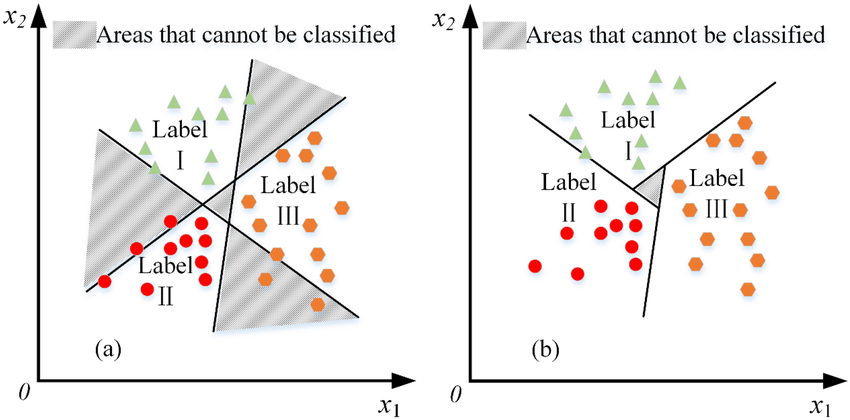

In [ ]:
svc_model=SVC() 
svc_model.fit(X_train,y_train)
pred_sv=svc_model.predict(X_test) 
pred_sv

Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.81      0.95      0.87        92
    Diabetes       0.76      0.44      0.56        36

    accuracy                           0.80       128
   macro avg       0.79      0.70      0.72       128
weighted avg       0.80      0.80      0.79       128

[[87  5]
 [20 16]]


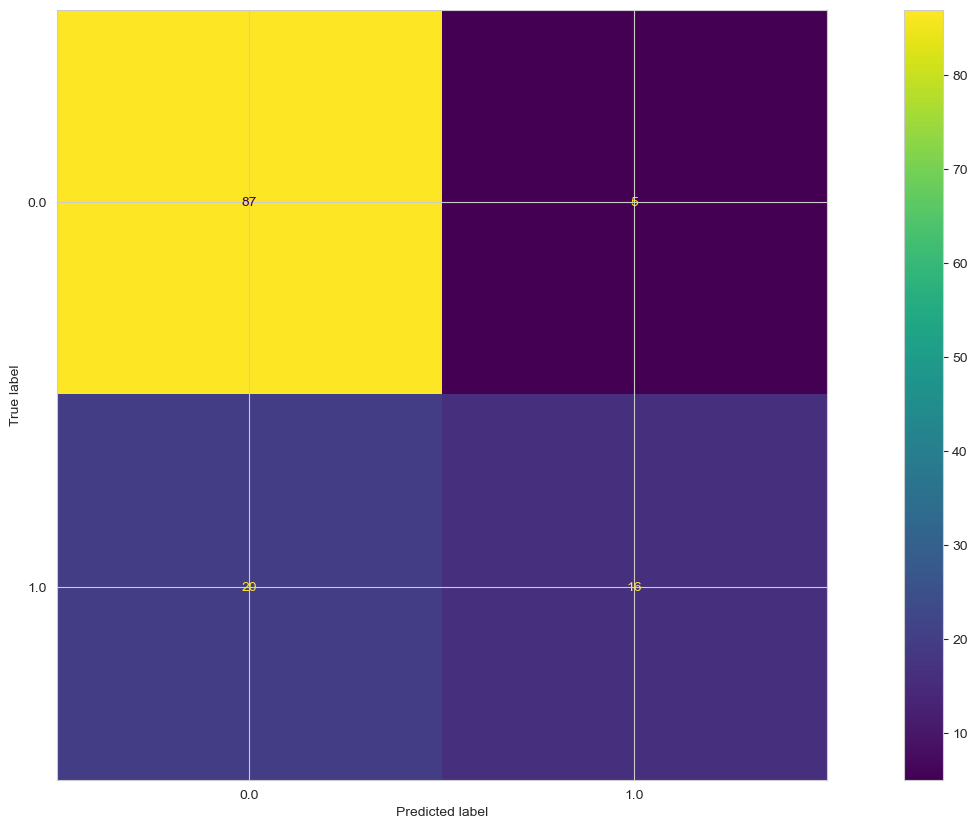

In [247]:
target_names = ['No Diabetes', 'Diabetes']
report = classification_report(y_test, pred_sv, target_names=target_names)
print("Classification Report:")
print(report)

conf_mett=confusion_matrix(y_test,pred_sv)
print(conf_mett)

ConfusionMatrixDisplay.from_estimator(svc_model, X_test, y_test)
plt.show()

In [248]:
acc_svc= round(accuracy_score(y_test,pred_sv) * 100, 2)
print(acc_svc)

80.47


In [249]:
accSCVT = round(svc_model.score(X_train,y_train) * 100, 2)
print(accSCVT)

78.28


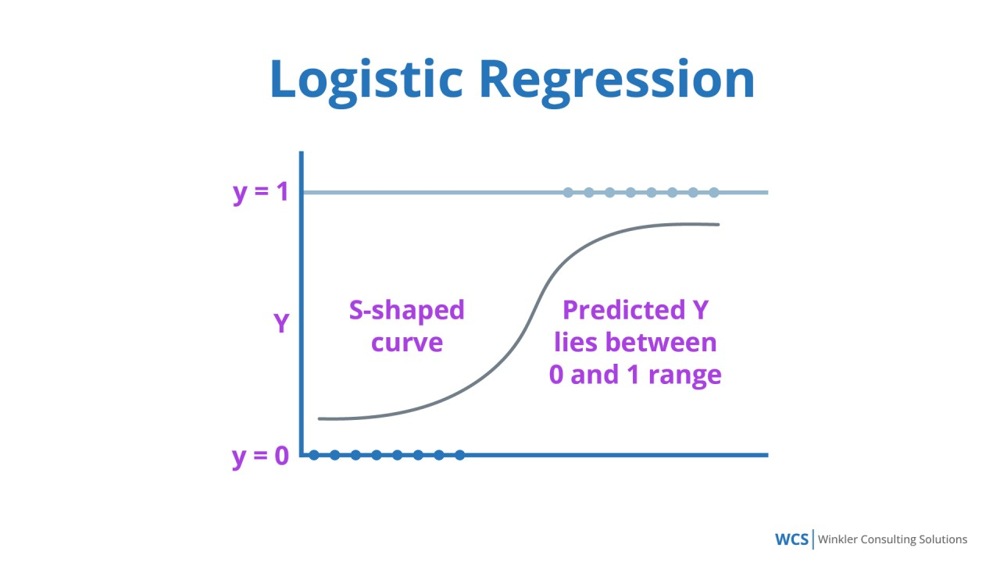

In [250]:
log_model=LogisticRegression(solver='lbfgs',max_iter=1200000) 
log_model.fit(X_train,y_train)
pred_log=log_model.predict(X_test)
pred_log

array([0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 0., 0., 1.,
       1., 0., 1., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0.,
       0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 0., 0., 0., 0., 0.])

Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.81      0.93      0.87        92
    Diabetes       0.73      0.44      0.55        36

    accuracy                           0.80       128
   macro avg       0.77      0.69      0.71       128
weighted avg       0.79      0.80      0.78       128

[[86  6]
 [20 16]]


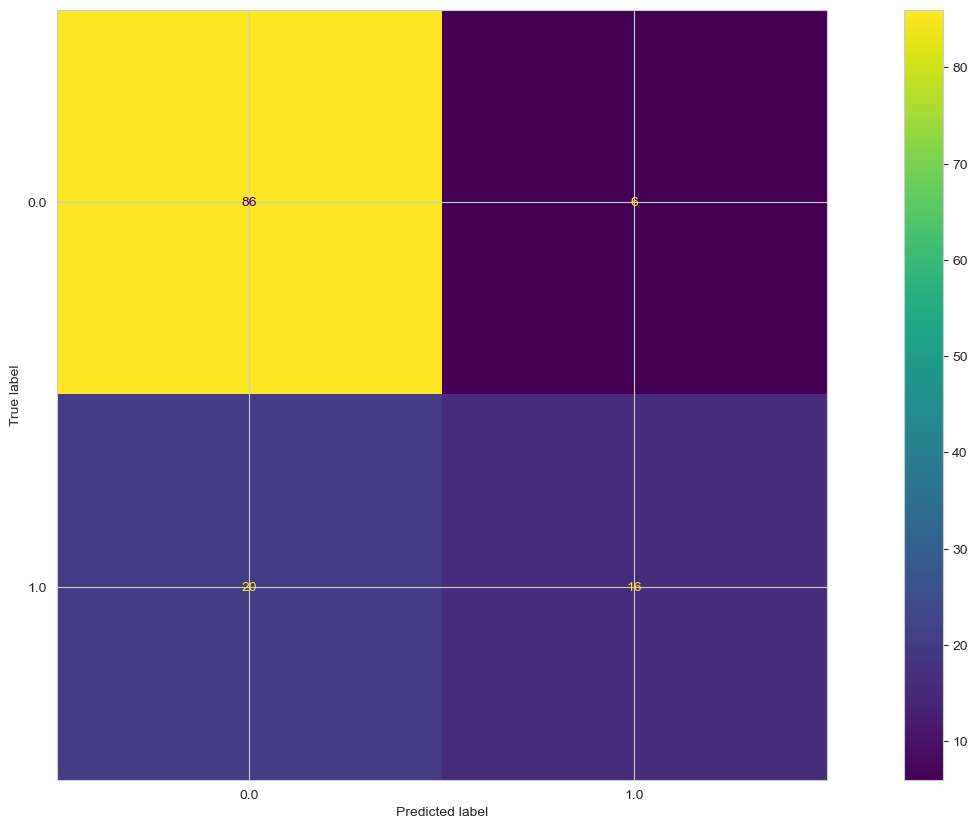

In [251]:
target_names = ['No Diabetes', 'Diabetes']
report = classification_report(y_test, pred_log, target_names=target_names)
print("Classification Report:")
print(report)

conf_met=metrics.confusion_matrix(y_test,pred_log)
print(conf_met)

ConfusionMatrixDisplay.from_estimator(log_model, X_test, y_test)
plt.show()

In [252]:
acc_LR = round(accuracy_score(y_test,pred_log) * 100, 2)
print(acc_LR)

79.69


In [253]:
acc_RLR = round(log_model.score(X_train,y_train) * 100, 2)
print(acc_RLR)

78.86


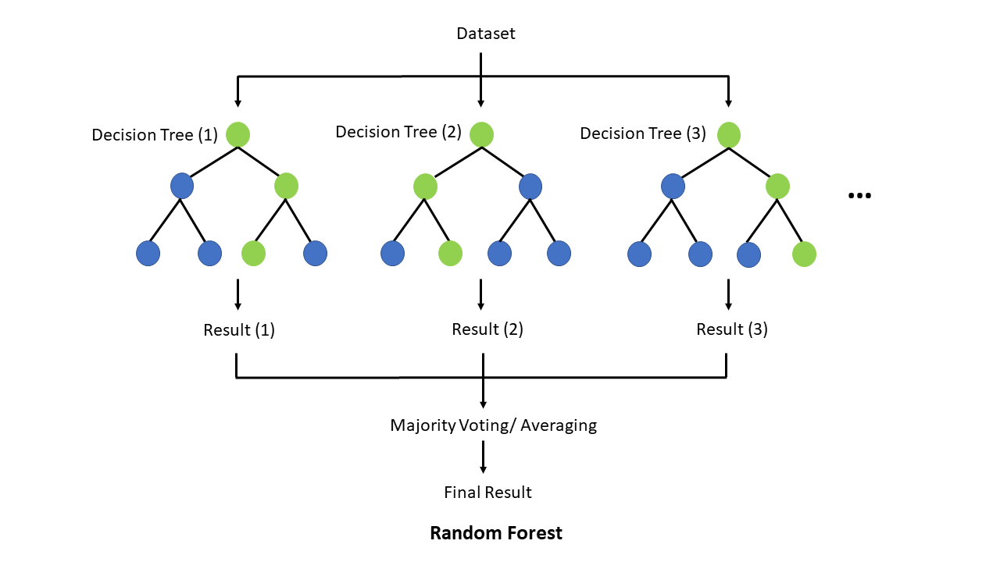!

In [254]:
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
pred_rfc = rfc.predict(X_test)
pred_rfc

array([0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0.,
       0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 1., 1., 0., 0., 0., 0., 1.,
       1., 0., 1., 1., 1., 0., 0., 1., 1., 0., 1., 0., 0., 1., 1., 0., 1.,
       1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 1.,
       1., 1., 0., 1., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 1.])

Classification Report:
              precision    recall  f1-score   support

 No Diabetes       0.87      0.85      0.86        92
    Diabetes       0.63      0.67      0.65        36

    accuracy                           0.80       128
   macro avg       0.75      0.76      0.75       128
weighted avg       0.80      0.80      0.80       128

[[78 14]
 [12 24]]


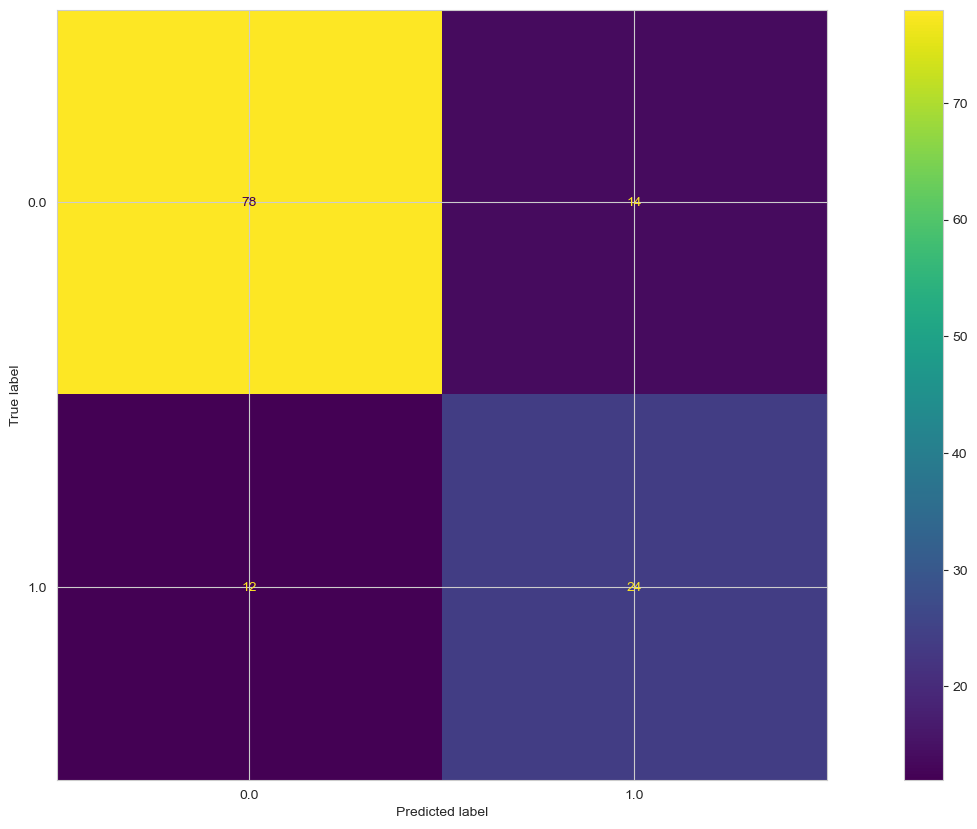

In [255]:
target_names = ['No Diabetes', 'Diabetes']
report = classification_report(y_test, pred_rfc, target_names=target_names)
print("Classification Report:")
print(report)

conf_met=metrics.confusion_matrix(y_test,pred_rfc)
print(conf_met)

ConfusionMatrixDisplay.from_estimator(rfc, X_test, y_test)
plt.show()

In [256]:
acc_RFC = round(accuracy_score(y_test,pred_rfc) * 100, 2)
print(acc_RFC)

79.69


In [257]:
acc_RRFC = round(rfc.score(X_train,y_train) * 100, 2)
print(acc_RRFC)

100.0
